In [1]:
# !pip install numpy
# !pip install matplotlib
# !pip install pandas
# !pip install seaborn
# !pip install scikit-learn
# !pip install Pillow
# !pip install tqdm
# !pip install scipy
# !pip install jupyter --upgrade
# !pip install ipywidgets --upgrade

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
from scipy.stats import kstest, pearsonr
from PIL import Image
import os
import itertools
import matplotlib.patheffects as path_effects
from matplotlib.patheffects import withStroke
import analysis_utils as au

# from pathlib import Path

# # Get the current notebook's directory
# notebook_dir = Path().resolve()
# os.chdir(notebook_dir)

# # Verify the change
# print(os.getcwd())


In [3]:
def filter_imgs_multiple_objects(df):
    # filter out imges with multiple objects in the same image:
    counts = df[['ImageNumber', 'ObjectNumber']].groupby('ImageNumber').agg('count')
    counts.columns=['Count']
    df_incl_counts = df.merge(counts, how='left', left_on='ImageNumber', right_index=True)
    df_filtered = df_incl_counts[df_incl_counts['Count'] == 1]
    return df_filtered

def filter_outliers(df, colnames: list, q_low, q_high):
    df['mask_to_keep'] = True
    for col in colnames:
        low = np.quantile(df[col], q_low)
        high = np.quantile(df[col], q_high)
        mask = (df[col] >= low) & (df[col] <= high)
        df['mask_to_keep'] = (df['mask_to_keep']) & (mask)
    df_filtered = df[df['mask_to_keep']]
    return df_filtered

def read_and_filter(filename, colnames=tuple(), q_low=0.025, q_high=0.975):
    df_raw = pd.read_csv(filename)
    df_1_obj_perimg = filter_imgs_multiple_objects(df_raw)
    df_filtered = filter_outliers(df_1_obj_perimg, colnames, q_low, q_high)
    return df_filtered

In [4]:
print(os.getcwd())

D:\topochip-flow-matching\cellprofiler validation


In [5]:
# define which csv to load:
filename = 'MyExpt_IdentifySecondaryObjects_H_threshold_H_primary.csv'
prefix_real = 'cp_output_archive/cp_output_allreal/'
prefix_fake = 'cp_output_archive/cp_output_allfake/'

path_to_cp_output = prefix_real + filename
second_path_to_cp_output = prefix_fake + filename

paths_to_yap_nucleus = [p + 'MyExpt_YAP_nucleus.csv' for p in [prefix_real, prefix_fake]]
paths_to_yap_cytoplasm = [p + 'MyExpt_YAP_cytoplasm.csv' for p in [prefix_real, prefix_fake]]

paths_to_dapi = [p + 'MyExpt_IdentifyPrimaryObjects_H_threshold.csv' for p in [prefix_real, prefix_fake]]

In [6]:
# read the csvs with pandas:


#### ACTIN:
df_actin = read_and_filter(path_to_cp_output)
if second_path_to_cp_output is not None:
    df2_actin = read_and_filter(second_path_to_cp_output)
    df_actin = pd.DataFrame(np.concatenate([df_actin.values, df2_actin.values], axis=0), columns=df_actin.columns)

    
### YAP in nucleus and cytoplasm:
dfs_yap_nucleus = [read_and_filter(p) for p in paths_to_yap_nucleus]
dfs_yap_cyto = [read_and_filter(p) for p in paths_to_yap_cytoplasm]

df_yap_nucleus = pd.DataFrame(np.concatenate([d.values for d in dfs_yap_nucleus], axis=0), columns=dfs_yap_nucleus[0].columns)
df_yap_cyto = pd.DataFrame(np.concatenate([d.values for d in dfs_yap_cyto], axis=0), columns=dfs_yap_cyto[0].columns)

df_yap = pd.DataFrame(np.concatenate([df_yap_nucleus.values, df_yap_cyto.values], axis=1),
                      columns=[c +'_nucleus' for c in df_yap_nucleus.columns] + [c +'_cyto' for c in df_yap_cyto.columns])
# 'Intensity_MeanIntensity_CorrYAP', 'Intensity_IntegratedIntensity_CorrYAP'

df_yap['Intensity_MeanIntensity_CorrYAP_cyto'][df_yap['Intensity_MeanIntensity_CorrYAP_cyto'] == 0] = np.nan
df_yap['Intensity_IntegratedIntensity_CorrYAP_cyto'][df_yap['Intensity_IntegratedIntensity_CorrYAP_cyto'] == 0] = np.nan

df_yap['Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'] = df_yap['Intensity_MeanIntensity_CorrYAP_nucleus'] / (df_yap['Intensity_MeanIntensity_CorrYAP_cyto'] + 1e-6)
df_yap['Intensity_IntegratedIntensity_CorrYAP_nucleus_div_cyto'] = df_yap['Intensity_IntegratedIntensity_CorrYAP_nucleus'] / (df_yap['Intensity_IntegratedIntensity_CorrYAP_cyto'] + 1e-6)


#### DAPI:
dfs_dapi = [read_and_filter(p) for p in paths_to_dapi]
df_dapi = pd.DataFrame(np.concatenate([d.values for d in dfs_dapi], axis=0), columns=dfs_dapi[0].columns)





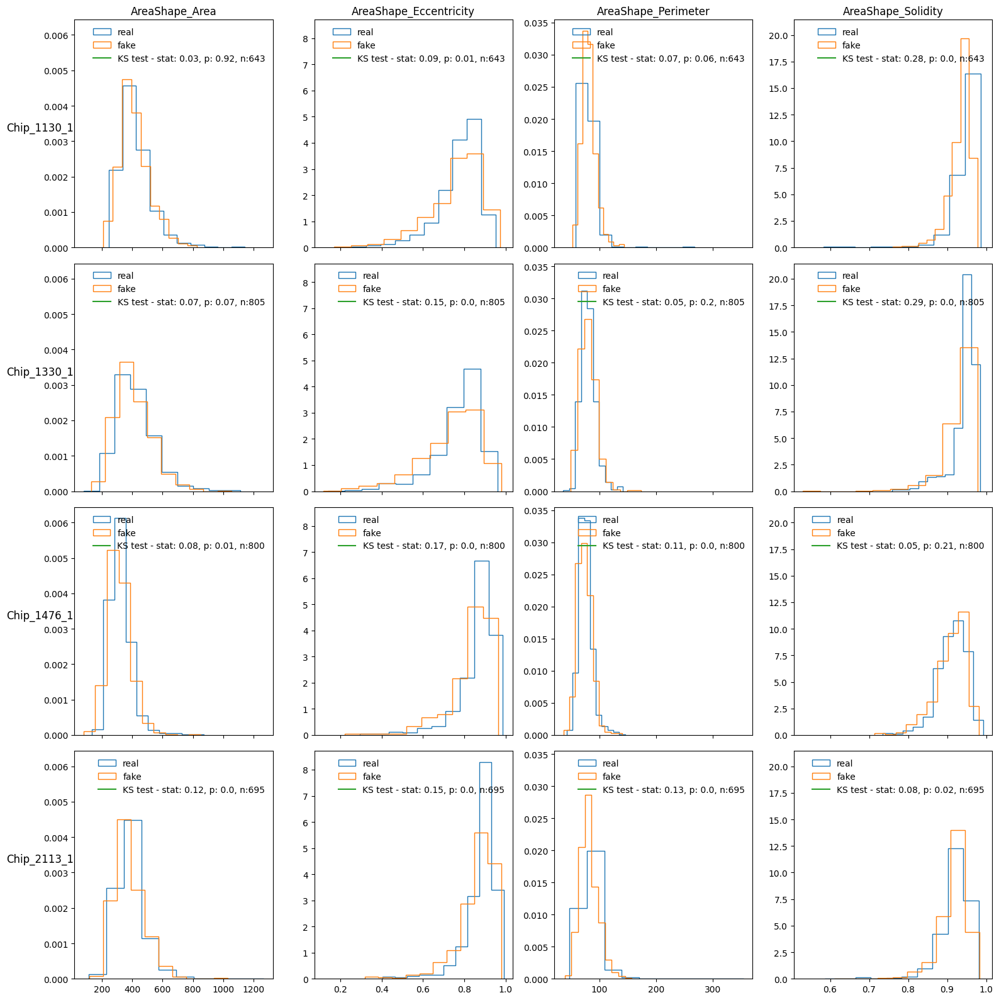

In [61]:

## DAPI:

df = df_dapi

# define the features to plot and the arguments for the plt.hist plotting function:
# feats will appear as columns in the plot grid
feats = ['AreaShape_Area', 'AreaShape_Eccentricity',  'AreaShape_Perimeter', 'AreaShape_Solidity',
#          'Intensity'
        ]
hist_kwargs = dict(density=True,)
# if Chips = None, will take all the chips in the data. otherwise provide a list of Chip names, like 'Chip_1710_1'
# chips = None  
chips = ['Chip_1130_1', 'Chip_1330_1', 'Chip_1476_1', 'Chip_2113_1']


# some magic to get lists of chips and sources:
chips = list(pd.Series(list(map(lambda x: x[:-5], df['Metadata_Chip'].unique()))).unique()) if chips is None else chips
sources = sorted(list(pd.Series(list(map(lambda x: x[-4:], df['Metadata_Chip'].unique()))).unique()), reverse=True)

size_mult=4

# start making the plot
fig, axs = plt.subplots(ncols=len(feats), nrows=len(chips), squeeze=False, figsize=(size_mult*len(feats), size_mult*(len(chips))),
                       sharex='col', sharey='col')


amounts_of_cells_for_ks = [i * 10 for i in range(1,20)]
p_values = []
p_values_real_real = []


for i, chip in enumerate(chips):  # plot each chip on a new row
    for j, feat in enumerate(feats): # plot each feature in a new column
        ax = axs[i,j]
        all_datas = []
        for k, source in enumerate(sources):
            data = df[df['Metadata_Chip'] == chip + '_' + source]
            all_datas.append(data[feat])
            # x, y = au.make_pretty_pdf(data[feat], **hist_kwargs)
            # ax.plot(x, y, label=source)
            ax.hist(data[feat], label=source, histtype='step', **hist_kwargs)
        p_values_this_iter = []
        p_values_real_real_this_iter = []
        if len(all_datas) == 2:
            for amount in amounts_of_cells_for_ks:
                ks = kstest(np.random.choice(all_datas[0], amount),
                            np.random.choice(all_datas[1], amount))
                p_values_this_iter.append(ks.pvalue)
                ks_real_real = kstest(np.random.choice(all_datas[0], amount),
                            np.random.choice(all_datas[0], amount))
                p_values_real_real_this_iter.append(ks_real_real.pvalue)
            
            p_values.append(p_values_this_iter)
            p_values_real_real.append(p_values_real_real_this_iter)
            
            ks = kstest(all_datas[0],
                       all_datas[1])
            ax.plot([], [], label=f'KS test - stat: {float(np.round(ks.statistic, 2))}, p: {float(np.round(ks.pvalue, 2))}, n:{all_datas[0].__len__()}')
        ax.legend(frameon=False)


# set the column and row labels:

for ax, col in zip(axs[0], feats):
    ax.set_title(col)

for ax, row in zip(axs[:,0], chips):
    ax.set_ylabel(row, rotation=0, size='large')

fig.tight_layout()
plt.savefig('all_hists_feats_dapi.pdf', transparent=True)
# plt.legend()
# plt.yscale('log')
plt.show()

p_values = np.array(p_values)
p_values_real_real = np.array(p_values_real_real)

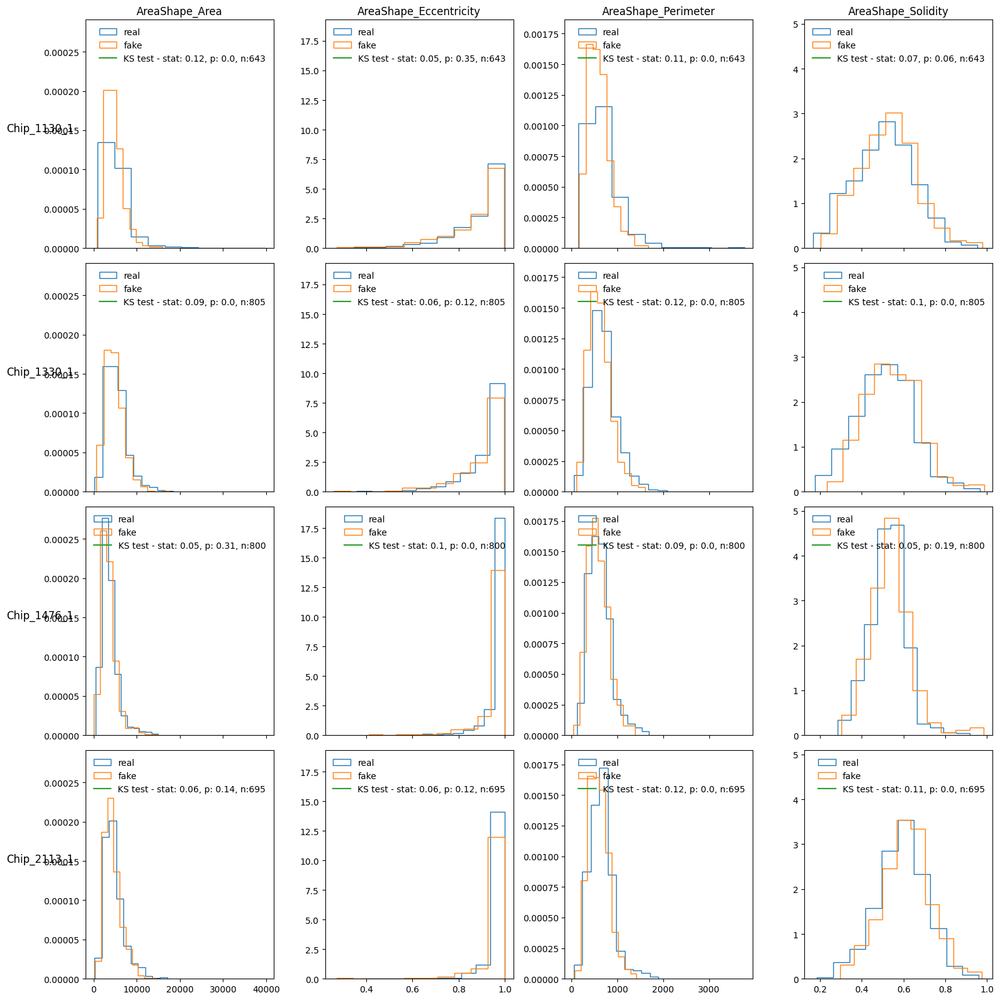

In [62]:

## ACTIN:

df = df_actin

# define the features to plot and the arguments for the plt.hist plotting function:
# feats will appear as columns in the plot grid
feats = ['AreaShape_Area', 'AreaShape_Eccentricity',  'AreaShape_Perimeter', 'AreaShape_Solidity',
#          'Intensity'
        ]
hist_kwargs = dict(density=True,)
# if Chips = None, will take all the chips in the data. otherwise provide a list of Chip names, like 'Chip_1710_1'
# chips = None  
chips = ['Chip_1130_1', 'Chip_1330_1', 'Chip_1476_1', 'Chip_2113_1']


# some magic to get lists of chips and sources:
chips = list(pd.Series(list(map(lambda x: x[:-5], df['Metadata_Chip'].unique()))).unique()) if chips is None else chips
sources = sorted(list(pd.Series(list(map(lambda x: x[-4:], df['Metadata_Chip'].unique()))).unique()), reverse=True)

size_mult=4

# start making the plot
fig, axs = plt.subplots(ncols=len(feats), nrows=len(chips), squeeze=False, figsize=(size_mult*len(feats), size_mult*(len(chips))),
                       sharex='col', sharey='col')


amounts_of_cells_for_ks = [i * 10 for i in range(1,20)]
p_values = []
p_values_real_real = []


for i, chip in enumerate(chips):  # plot each chip on a new row
    for j, feat in enumerate(feats): # plot each feature in a new column
        ax = axs[i,j]
        all_datas = []
        for k, source in enumerate(sources):
            data = df[df['Metadata_Chip'] == chip + '_' + source]
            all_datas.append(data[feat])
            # x, y = au.make_pretty_pdf(data[feat], **hist_kwargs)
            # ax.plot(x, y, label=source)
            ax.hist(data[feat], label=source, histtype='step', **hist_kwargs)
        p_values_this_iter = []
        p_values_real_real_this_iter = []
        if len(all_datas) == 2:
            for amount in amounts_of_cells_for_ks:
                ks = kstest(np.random.choice(all_datas[0], amount),
                            np.random.choice(all_datas[1], amount))
                p_values_this_iter.append(ks.pvalue)
                ks_real_real = kstest(np.random.choice(all_datas[0], amount),
                            np.random.choice(all_datas[0], amount))
                p_values_real_real_this_iter.append(ks_real_real.pvalue)
            
            p_values.append(p_values_this_iter)
            p_values_real_real.append(p_values_real_real_this_iter)
            
            ks = kstest(all_datas[0],
                       all_datas[1])
            ax.plot([], [], label=f'KS test - stat: {float(np.round(ks.statistic, 2))}, p: {float(np.round(ks.pvalue, 2))}, n:{all_datas[0].__len__()}')
        ax.legend(frameon=False)


# set the column and row labels:

for ax, col in zip(axs[0], feats):
    ax.set_title(col)

for ax, row in zip(axs[:,0], chips):
    ax.set_ylabel(row, rotation=0, size='large')

fig.tight_layout()
plt.savefig('all_hists_feats.pdf', transparent=True)
# plt.legend()
# plt.yscale('log')
plt.show()

p_values = np.array(p_values)
p_values_real_real = np.array(p_values_real_real)

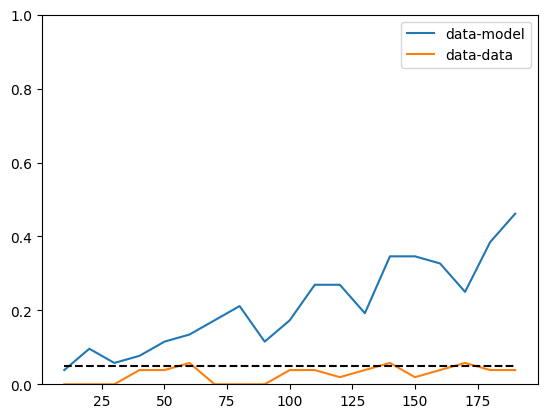

In [9]:
p_val_thresh = 0.05
reject_rate = (p_values <= p_val_thresh).mean(axis=0)
reject_rate_real_real = (p_values_real_real <= p_val_thresh).mean(axis=0)

fig, ax = plt.subplots(1,1)
plt.plot(amounts_of_cells_for_ks, reject_rate, label='data-model')
plt.plot(amounts_of_cells_for_ks, reject_rate_real_real, label='data-data')
plt.hlines(p_val_thresh, min(amounts_of_cells_for_ks), max(amounts_of_cells_for_ks), colors=['black'], linestyles='--')
plt.legend()
plt.ylim(0,1)
plt.show()

['Intensity_MeanIntensity_CorrYAP_nucleus', 'Intensity_MeanIntensity_CorrYAP_cyto', 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto']


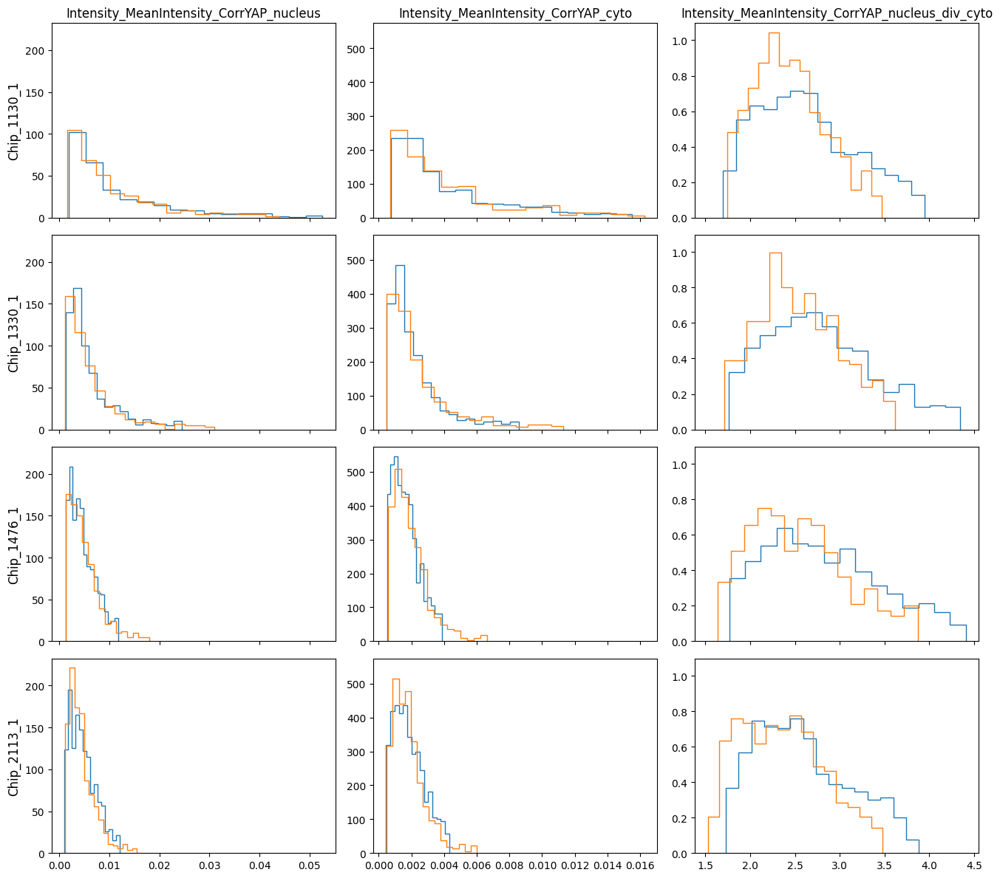

In [63]:
## YAP localization:
import warnings
df = df_yap

# define the features to plot and the arguments for the plt.hist plotting function:
# feats will appear as columns in the plot grid
feats = ['Intensity_MeanIntensity_CorrYAP']
suffices = ['_nucleus', '_cyto', '_nucleus_div_cyto']


hist_kwargs = dict(bins=15, density=True, histtype='step')
# if Chips = None, will take all the chips in the data. otherwise provide a list of Chip names, like 'Chip_1710_1'
chips = None  
chips = ['Chip_1130_1', 'Chip_1330_1', 'Chip_1476_1', 'Chip_2113_1']
q_lim = 0.05

# some magic to get lists of chips and sources:
chips = list(pd.Series(list(map(lambda x: x[:-5], df['Metadata_Chip_nucleus'].unique()))).unique()) if chips is None else chips
sources = sorted(list(pd.Series(list(map(lambda x: x[-4:], df['Metadata_Chip_nucleus'].unique()))).unique()), reverse=True)

# get all feats+suffix combinations:

feats = [i + j for i,j in itertools.product(feats, suffices)]
print(feats)

# start making the plot
size_mult=3
fig, axs = plt.subplots(ncols=len(feats), nrows=len(chips), squeeze=False, figsize=(1.5*size_mult*len(feats), (size_mult*len(chips))),
                       sharex='col', sharey='col')

for i, chip in enumerate(chips):  # plot each chip on a new row
    for j, feat in enumerate(feats): # plot each feature in a new column
        ax = axs[i,j]
        all_datas = []
        for k, source in enumerate(sources):
            data = df[df['Metadata_Chip_nucleus'] == chip + '_' + source]
            data = data[~data[feat].isna()]
            all_datas.append(data[feat])
            if q_lim is not None:
                plot_r = (np.quantile(data[feat], q_lim), np.quantile(data[feat], 1-q_lim))
            else:
                plot_r = None
            ax.hist(data[feat], label=source, range=plot_r, **hist_kwargs)
        if len(all_datas) == 2:
            ks = kstest(all_datas[0], all_datas[1])
            ax.plot([], [], label=f'KS test - stat: {float(np.round(ks.statistic, 2))}, p: {float(np.round(ks.pvalue, 2))}, n:{all_datas[0].__len__()}')
#         ax.legend(frameon=False)


# set the column and row labels:

for ax, col in zip(axs[0], feats):
    ax.set_title(col)

for ax, row in zip(axs[:,0], chips):
    ax.set_ylabel(row, rotation=90, size='large')

fig.tight_layout()
plt.savefig('all_hists_yap.pdf')
# plt.legend()
# plt.yscale('log')
plt.show()

In [11]:
# ## YAP localization:
# import warnings
# df = df_yap

# # define the features to plot and the arguments for the plt.hist plotting function:
# # feats will appear as columns in the plot grid
# feats = ['Intensity_IntegratedIntensity_CorrYAP']
# suffices = ['_nucleus', '_cyto']


# hist_kwargs = dict(bins=20, density=True, histtype='step')
# # if Chips = None, will take all the chips in the data. otherwise provide a list of Chip names, like 'Chip_1710_1'
# chips = None  
# # chips = ['Chip_1710_1']
# q_lim = 0.05

# # some magic to get lists of chips and sources:
# chips = list(pd.Series(list(map(lambda x: x[:-5], df['Metadata_Chip_nucleus'].unique()))).unique()) if chips is None else chips
# sources = sorted(list(pd.Series(list(map(lambda x: x[-4:], df['Metadata_Chip_nucleus'].unique()))).unique()), reverse=True)

# # get all feats+suffix combinations:

# feats = [i + j for i,j in itertools.product(feats, suffices)]
# print(feats)

# # start making the plot
# fig, axs = plt.subplots(ncols=len(feats), nrows=len(chips), squeeze=False, figsize=(5*len(feats), (3*len(chips))),
#                        sharex=True, sharey=True)

# for i, chip in enumerate(chips):  # plot each chip on a new row
#     for j, feat in enumerate(feats): # plot each feature in a new column
#         ax = axs[i,j]
#         all_datas = []
#         for k, source in enumerate(sources):
#             data = df[df['Metadata_Chip_nucleus'] == chip + '_' + source]
#             data = data[~data[feat].isna()]
#             all_datas.append(data[feat])
#             if q_lim is not None:
#                 plot_r = (np.quantile(data[feat], q_lim), np.quantile(data[feat], 1-q_lim))
#             else:
#                 plot_r = None
#             ax.hist(data[feat], label=source, range=plot_r, **hist_kwargs)
#         if len(all_datas) == 2:
#             ks = kstest(all_datas[0], all_datas[1])
#             ax.plot([], [], label=f'KS test - stat: {float(np.round(ks.statistic, 2))}, p: {float(np.round(ks.pvalue, 2))}, n:{all_datas[0].__len__()}')
#         ax.legend()


# # set the column and row labels:

# for ax, col in zip(axs[0], feats):
#     ax.set_title(col)

# for ax, row in zip(axs[:,0], chips):
#     ax.set_ylabel(row, rotation=0, size='large')

# fig.tight_layout()
# plt.savefig('all_hists_yap.pdf')
# # plt.legend()
# # plt.yscale('log')
# plt.show()

['Intensity_IntegratedIntensity_CorrYAP_nucleus_div_cyto', 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto']


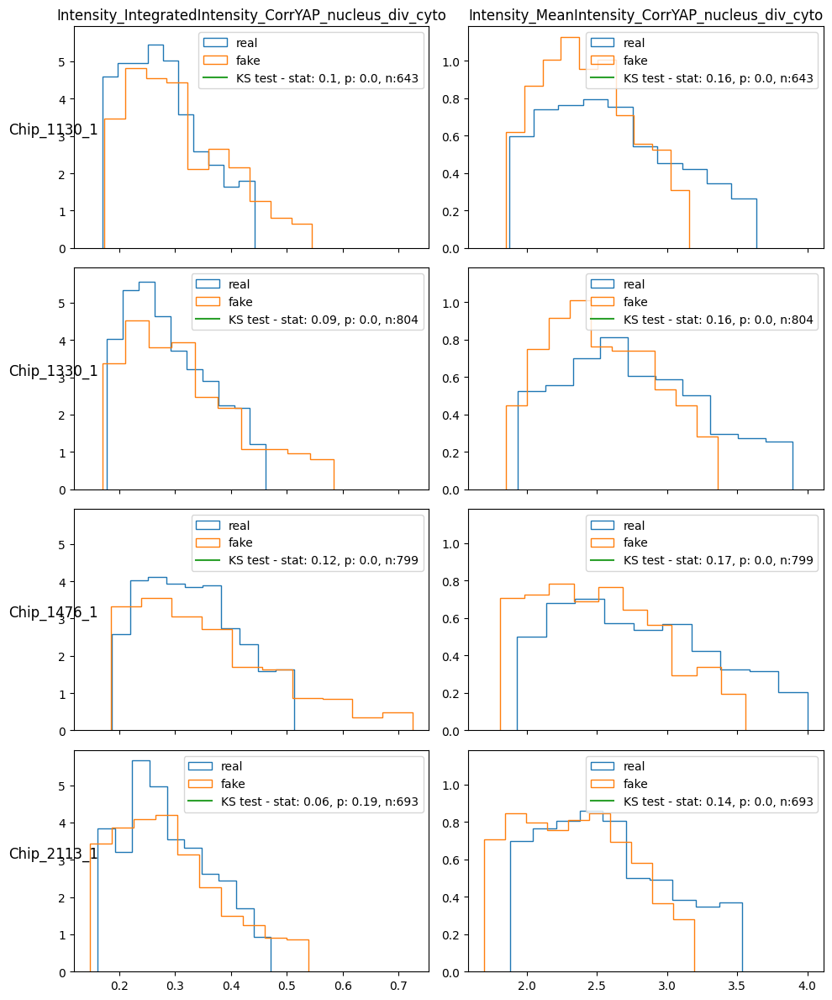

In [64]:


## YAP localization:
import warnings
df = df_yap

# define the features to plot and the arguments for the plt.hist plotting function:
# feats will appear as columns in the plot grid
feats = ['Intensity_IntegratedIntensity_CorrYAP', 'Intensity_MeanIntensity_CorrYAP']
suffices = ['_nucleus_div_cyto']


hist_kwargs = dict(bins=10, density=True, histtype='step')
# if Chips = None, will take all the chips in the data. otherwise provide a list of Chip names, like 'Chip_1710_1'
# chips = None  
chips = ['Chip_1130_1', 'Chip_1330_1', 'Chip_1476_1', 'Chip_2113_1']
q_lim = 0.1

# some magic to get lists of chips and sources:
chips = list(pd.Series(list(map(lambda x: x[:-5], df['Metadata_Chip_nucleus'].unique()))).unique()) if chips is None else chips
sources = sorted(list(pd.Series(list(map(lambda x: x[-4:], df['Metadata_Chip_nucleus'].unique()))).unique()), reverse=True)

# get all feats+suffix combinations:

feats = [i + j for i,j in itertools.product(feats, suffices)]
print(feats)

# start making the plot
fig, axs = plt.subplots(ncols=len(feats), nrows=len(chips), squeeze=False, figsize=(5*len(feats), (3*len(chips))),
                       sharex='col', sharey='col')

for i, chip in enumerate(chips):  # plot each chip on a new row
    for j, feat in enumerate(feats): # plot each feature in a new column
        ax = axs[i,j]
        all_datas = []
        for k, source in enumerate(sources):
            data = df[df['Metadata_Chip_nucleus'] == chip + '_' + source]
            data = data[~data[feat].isna()]
            all_datas.append(data[feat])
            if q_lim is not None:
                plot_r = (np.quantile(data[feat], q_lim), np.quantile(data[feat], 1-q_lim))
            else:
                plot_r = None
            ax.hist(data[feat], label=source, range=plot_r, **hist_kwargs)
        if len(all_datas) == 2:
            ks = kstest(all_datas[0], all_datas[1])
            ax.plot([], [], label=f'KS test - stat: {float(np.round(ks.statistic, 2))}, p: {float(np.round(ks.pvalue, 2))}, n:{all_datas[0].__len__()}')
        ax.legend()
#         ax.set_yscale('log')
#         ax.set_xscale('log')


# set the column and row labels:

for ax, col in zip(axs[0], feats):
    ax.set_title(col)

for ax, row in zip(axs[:,0], chips):
    ax.set_ylabel(row, rotation=0, size='large')

fig.tight_layout()
plt.savefig('all_hists_yap.pdf')
# plt.legend()

plt.show()

In [65]:
# # compare different chips in generated and real to see the effect of conditioning:
# from itertools import product

# # define the features to plot and the arguments for the plt.hist plotting function:
# # feats will appear as columns in the plot grid
# feats = ['AreaShape_Area', 'AreaShape_Eccentricity',  'AreaShape_Perimeter', 'AreaShape_Solidity',
# #          'Intensity'
#         ]
# hist_kwargs = dict(bins=10, density=True, histtype='step')
# # if Chips = None, will take all the chips in the data. otherwise provide a list of Chip names, like 'Chip_1710_1'
# chips = None  
# # chips = ['Chip_1710_1']


# # some magic to get lists of chips and sources:
# chips = list(pd.Series(list(map(lambda x: x[:-5], df['Metadata_Chip'].unique()))).unique()) if chips is None else chips
# sources = sorted(list(pd.Series(list(map(lambda x: x[-4:], df['Metadata_Chip'].unique()))).unique()), reverse=True)

# # start making the plot
# fig, axs = plt.subplots(ncols=len(feats), nrows=len(sources), squeeze=False, figsize=(5*len(feats), 5*(len(sources))),
#                        sharex='col', sharey='col')

# for k, source in enumerate(sources):
#     for j, feat in enumerate(feats): # plot each feature in a new column
#         ax = axs[k,j]
#         all_datas = []
#         for i, chip in enumerate(chips):
#             data = df[df['Metadata_Chip'] == chip + '_' + source]
#             all_datas.append(data[feat])
#             ax.hist(data[feat], label=chip, **hist_kwargs)
#         for d1, data1 in enumerate(all_datas):
#             for d2, data2 in enumerate(all_datas):
#                 if d2 > d1:
#                     ks = kstest(all_datas[d1], all_datas[d2])
#                     ax.plot(
#                         [], [], label=f'KS {chips[d1][5:]} {chips[d2][5:]} - stat: {float(np.round(ks.statistic, 2))}, p: {float(np.round(ks.pvalue, 2))}'
#                     )
# #         ax.legend()


# # set the column and row labels:

# for ax, col in zip(axs[0], feats):
#     ax.set_title(col)

# for ax, row in zip(axs[:,0], sources):
#     ax.set_ylabel(row, rotation=0, size='large')

# # fig.tight_layout()
# # plt.legend()      
# plt.show()

In [66]:
def calc_moment(data, p=1, normalize=True):
    pow_back = 1.0 if not normalize else 1/p
    return (data**p).mean()**pow_back if p != 0 else 1.0

In [67]:
# for i, chip in tqdm(enumerate(chips)):
#     for j, feat in enumerate(feats):
#         for p in range(1,3):
#             moments_sources_this = []
#             for k, source in enumerate(sources):
#                 data = df[df['Metadata_Chip'] == chip + '_' + source][feat]
#                 m = np.round(calc_moment(data, p=p), 3)
#                 moments_sources_this.append(m)
#             print(f"{chip}-{feat} {p}'th moment {sources} = {moments_sources_this}")
            

In [68]:
# import matplotlib
# cmap = plt.get_cmap('viridis')
# feats = ['AreaShape_Area', 'AreaShape_Eccentricity',  'AreaShape_Perimeter', 'AreaShape_Solidity',
# #          'Intensity'
#         ]
# df = df_actin

# def make_heatmap_for_chip(df, chip, feats, sources):
#     means =  []
#     stds = []
#     maxs =  []
#     mins = []

#     for k, source in enumerate(sources):
#         means_this = []
#         stds_this = []
#         mins_this = []
#         maxs_this = []
#         for j, feat in enumerate(feats):
#             data = df[df['Metadata_Chip'] == chip + '_' + source][feat]
#             m = np.mean(data)
#             s = np.std(data)
#             ma = np.max(data)
#             mi = np.min(data)
#             means_this.append(m)
#             stds_this.append(s)
#             maxs_this.append(ma)
#             mins_this.append(mi)
#         means.append(means_this)
#         stds.append(stds_this)
#         maxs.append(maxs_this)
#         mins.append(mins_this)

#     means = np.array(means)
    
#     maxs = np.array(maxs)
#     mins = np.array(mins)
#     ma_per_feat = np.max(maxs, axis=0, keepdims=True)
#     mi_per_feat = np.min(mins, axis=0, keepdims=True)
#     #means = (means - mi_per_feat) / (ma_per_feat - mi_per_feat)
    
#     diffs = np.abs(means[0:1] - means[1:2]) / means[0:1] * 100
#     means_w_diff = np.concatenate([means, diffs], axis=0)
#     means = means_w_diff
# #     stds = np.array(stds)
# #     stds_real = stds[0:1]
# #     means_corr = (means[0:1] + means[1:2]) / 2
# #     means = (means - means_corr)/stds_real

#     fig, ax = plt.subplots(figsize=(15,15))
#     im = ax.imshow(means)
#     ax.set_xticks(np.arange(len(feats)), labels=feats)
#     ax.set_yticks(np.arange(len(sources) + 1), labels=sources + ['diff'])
#     for i in range(means.shape[0]):
#         for j in range(means.shape[1]):
#             text = ax.text(j, i, means[i, j], ha='center', va='center', color='w')
#     plt.title(chip)
#     plt.colorbar(im)
#     plt.show()
    

# for chip in chips:
#     make_heatmap_for_chip(df, chip, feats, sources)


In [69]:
import matplotlib
cmap = matplotlib.colormaps['viridis']

df = df_actin
feats = ['AreaShape_FormFactor', 'AreaShape_Extent','AreaShape_MinorAxisLength',
         'AreaShape_Eccentricity',  'AreaShape_Perimeter', 'AreaShape_Compactness', 
         'AreaShape_MajorAxisLength', 'AreaShape_Orientation',
         'AreaShape_Area','AreaShape_Solidity',
         #'AreaShape_EulerNumber'
#          'Intensity'
        ]

chips = list(pd.Series(list(map(lambda x: x[:-5], df_actin['Metadata_Chip'].unique()))).unique())


def get_mean_of_chip(df, chip, feats, sources):
    means =  []
    stds = []
    maxs =  []
    mins = []

    for k, source in enumerate(sources):
        means_this = []
        stds_this = []
        mins_this = []
        maxs_this = []
        for j, feat in enumerate(feats):
            data = df[df['Metadata_Chip'] == chip + '_' + source][feat]
            m = np.mean(data)
            s = np.std(data)
            ma = np.max(data)
            mi = np.min(data)
            means_this.append(m)
            stds_this.append(s)
            maxs_this.append(ma)
            mins_this.append(mi)
        means.append(means_this)
        stds.append(stds_this)
        maxs.append(maxs_this)
        mins.append(mins_this)

    means = np.array(means)
    return means
    
    

    
all_means_arrs = {}
for chip in chips:
    means_this_chip = get_mean_of_chip(df, chip, feats, sources)
    all_means_arrs[chip] = means_this_chip


In [70]:
full_arr = np.zeros(shape=(len(all_means_arrs.items())*2, len(feats)))
arr_real = np.zeros(shape=(len(all_means_arrs.items()), len(feats)))
arr_fake = np.zeros(shape=(len(all_means_arrs.items()), len(feats)))
for i, (k, v) in enumerate(all_means_arrs.items()):
    full_arr[2*i:2*i+2] = v
    arr_real[i] = v[0]
    arr_fake[i] = v[1]

real:


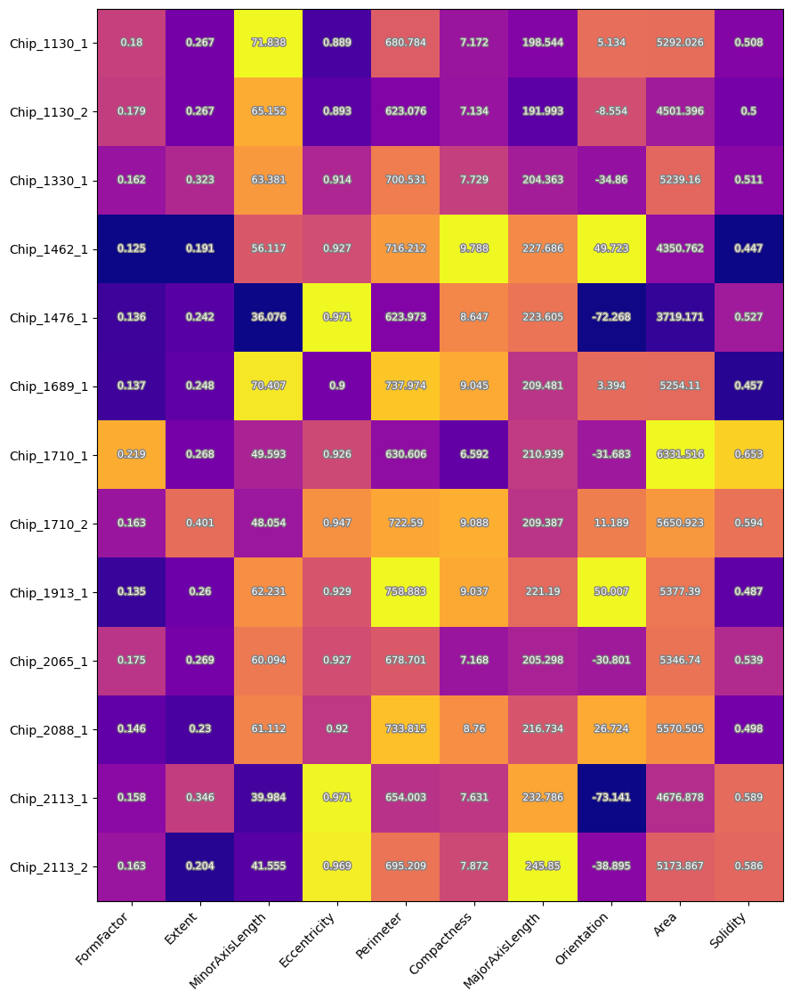

fake:


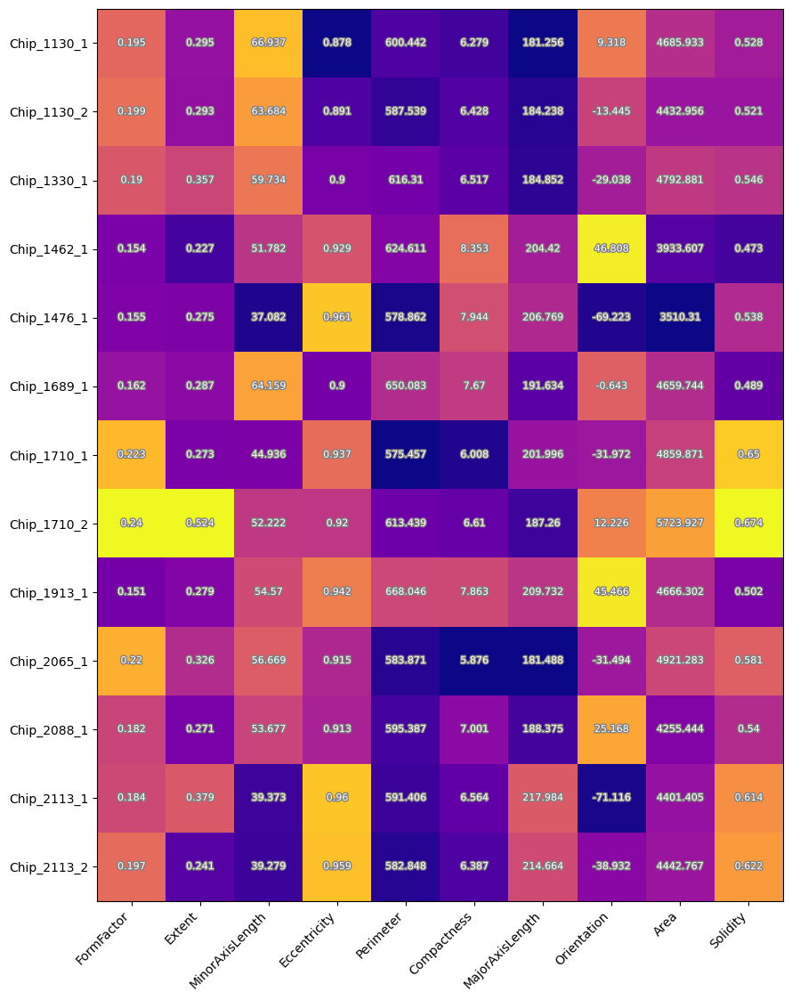

In [71]:


def make_heatmap(arr, feats, chips, arr_labels=None, cmap='viridis'):

    im = ax.imshow(arr, cmap=cmap)
    ax.set_xticks(np.arange(len(feats)))
    ax.set_xticklabels([feat.split('_')[1] for feat in feats], rotation=45, ha='right')

    ax.set_yticks(np.arange(len(chips)))
    ax.set_yticklabels(chips)

    
    lab_arr = arr if arr_labels is None else arr_labels
    lab_arr = np.round(lab_arr, 3)
    
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            text = ax.text(j, i, lab_arr[i,j], ha='center', va='center', color='w', fontsize=8)
            text.set_path_effects([withStroke(linewidth=2, foreground='gray')])  # Adds a shadow effect
#     plt.colorbar(im, )



def normalize_columnwise(arr):
    return (arr - np.min(arr, axis=0, keepdims=True)) / (np.max(arr, axis=0, keepdims=True) - np.min(arr, axis=0, keepdims=True))
#     return (arr) / (np.max(np.abs(arr), axis=0, keepdims=True))


cmap='plasma'

print('real:')
fsize = (9, 15)
fig, ax = plt.subplots(figsize=fsize)
make_heatmap(normalize_columnwise(full_arr)[::2], feats, chips, arr_labels=arr_real, cmap=cmap)
plt.tight_layout()
plt.savefig('fingerprint_real.pdf', transparent=True)
plt.show()
print('fake:')
fig, ax = plt.subplots(figsize=fsize)
make_heatmap(normalize_columnwise(full_arr)[1::2], feats, chips, arr_labels=arr_fake, cmap=cmap)
plt.tight_layout()
plt.savefig('fingerprint_fake.pdf', transparent=True)
plt.show()
# print('diff:')
# fig, ax = plt.subplots(figsize=fsize)

# make_heatmap(normalize_columnwise((full_arr[::2]-full_arr[1::2]) / full_arr[::2]),
#              feats, chips, arr_labels=np.abs((full_arr[::2]-full_arr[1::2])) / full_arr[::2] * 100, cmap=cmap)
# plt.tight_layout()

# plt.show()




C:\Users\s161975\AppData\Local\Temp\ipykernel_19004\4062797817.py:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


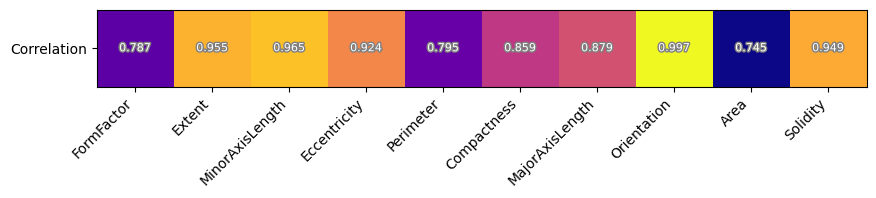

In [72]:
# correlation of the fingerprint per chip:

# Calculate row-wise Pearson correlation
corrs = np.array([pearsonr(row1, row2)[0] for row1, row2 in zip(arr_real.T, arr_fake.T)])[None,:]
fig, ax = plt.subplots(figsize=(15, 1))
make_heatmap(corrs, feats, ['Correlation'], cmap='plasma')
# ax.imshow(corrs, cmap=cmap)
plt.tight_layout()
plt.savefig('corr_fingerprint.pdf', transparent=True, bbox_inches='tight')
plt.show()

In [73]:
path_real_imgs = 'real_images_29-4-25_insert_preproc'
path_generated_imgs = 'generated_images_tiff_inject_newpreproc'

In [74]:
def load_imgs(source_fold, chip, filter_kwds=None, num=1):
    images = os.listdir(os.path.join(source_fold, chip))
    filtered_images = list(filter(lambda x: all([f_kw.lower() in x.lower() for f_kw in filter_kwds]),
                            images))
    if num is not None:
        num = min(num, len(filtered_images))
        ims_out = np.random.choice(filtered_images, size=num, replace=False)
    else:
        ims_out = filtered_images
    ims = [np.array(Image.open(os.path.join(source_fold, chip, im))) for im in ims_out]
    return ims

In [75]:
test = load_imgs(path_real_imgs, 'Chip_1130_1_real', filter_kwds=['background'])

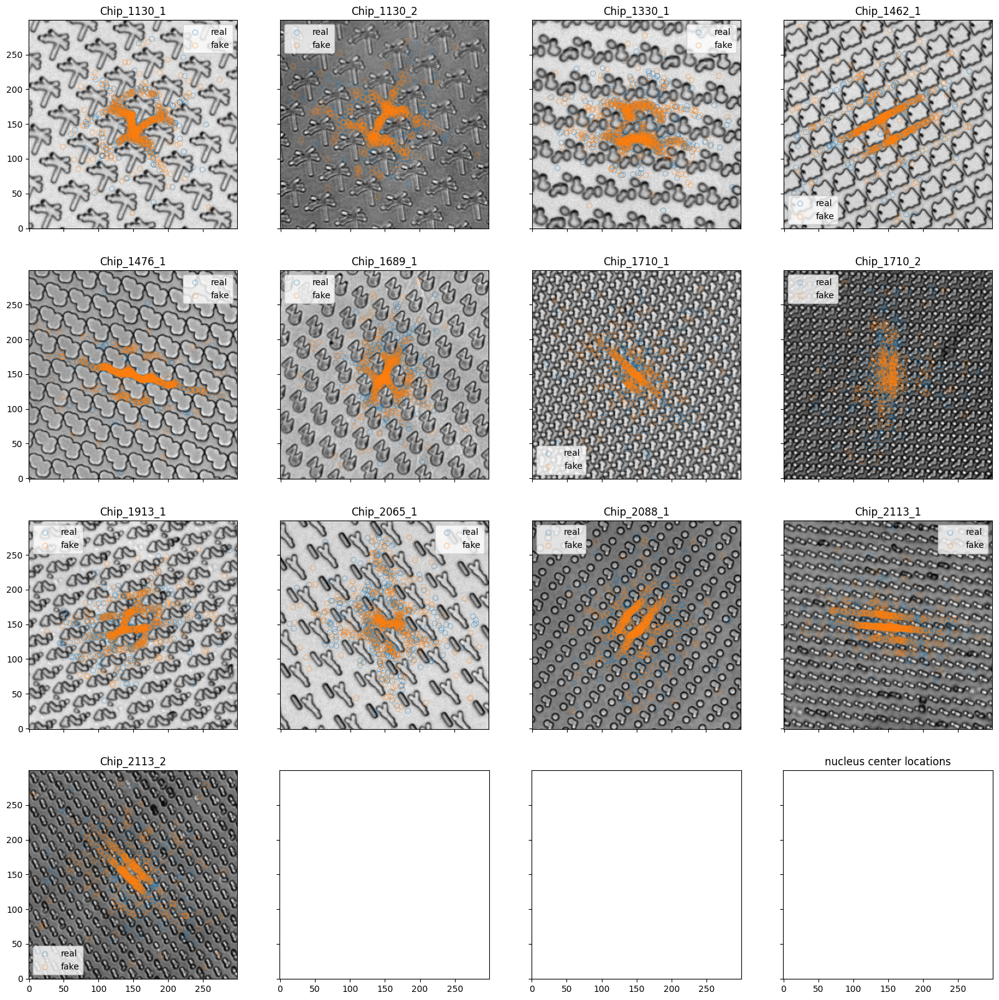

In [76]:
###
# plot a scatterplot of the x and y center of the cell:

# use the dapi df instead of actin:

df = df_dapi

feat_x = 'AreaShape_Center_X'
feat_y = 'AreaShape_Center_Y'
num_columns = 4
num_rows = int(np.ceil(len(chips) / num_columns))

fig, axs = plt.subplots(num_rows, num_columns, sharex=True, sharey=True, figsize=(5*num_columns, 5*num_rows), squeeze=False)
colors = ['tab:blue', 'tab:orange']

for i, chip in enumerate(chips):
    for k, source in enumerate(sources):
        ax = axs[i // num_columns, i % num_columns]
        data_this = df[df['Metadata_Chip'] == chip + '_' + source]
        bg = load_imgs(path_real_imgs, chip + '_real', ['background'])[0]
        ax.imshow(bg, cmap='gray', origin='lower')
#         corr = float(np.round(pearsonr(data_this[feat_x].astype(float), data_this[feat_y].astype(float))[0], 2))
        ax.scatter(data_this[feat_x], data_this[feat_y],
                   marker='o', facecolor='none', 
                   edgecolor=colors[k], 
                    label=source,
                   alpha=0.35)
        
        ax.set_title(chip)
        ax.legend()

plt.title('nucleus center locations')
plt.savefig('center_on_bg_scatter.png')
plt.show()

In [77]:
# make a heatmap of dapi staining intensities on the background:

  0%|          | 0/13 [00:00<?, ?it/s]

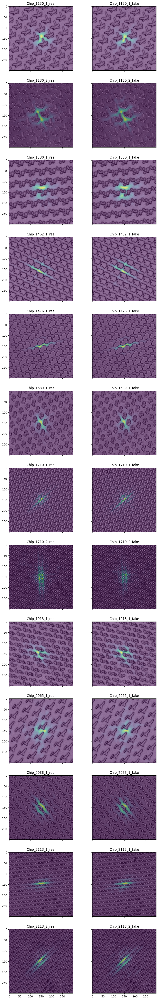

In [26]:
df = df_dapi


num_columns = 2
num_rows = len(chips)

fig, axs = plt.subplots(num_rows, num_columns, sharex=True, sharey=True, figsize=(5*num_columns, 5*num_rows), squeeze=False)
colors = ['tab:green', 'tab:purple']


folds = (path_real_imgs, path_generated_imgs)

for i, chip in tqdm(enumerate(chips), total=len(chips)):
    for k, source in enumerate(sources):
        ax = axs[i, k]
#         data_this = df[df['Metadata_Chip'] == chip + '_' + source]
        bg = load_imgs(path_real_imgs, chip + '_real', ['background'])[0]
        dapis = np.dstack(
            load_imgs(folds[k], chip + '_' + source, ['DAPI'], num=None)
        )
#         print(dapis.shape)
        ax.imshow(bg, cmap='gray')
        ax.imshow(dapis.mean(-1), alpha=0.5)        
        ax.set_title(chip + '_'+ source)
#         ax.legend()

# plt.savefig('heatmap_dapi_on_bg.png')
plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

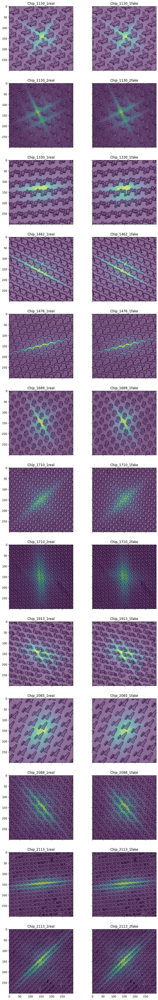

In [27]:
df = df_actin


num_columns = 2
num_rows = len(chips)

fig, axs = plt.subplots(num_rows, num_columns, sharex=True, sharey=True, figsize=(5*num_columns, 5*num_rows), squeeze=False)
colors = ['tab:green', 'tab:purple']


folds = (path_real_imgs, path_generated_imgs)

for i, chip in tqdm(enumerate(chips), total=len(chips)):
    for k, source in enumerate(sources):
        ax = axs[i, k]
#         data_this = df[df['Metadata_Chip'] == chip + '_' + source]
        bg = load_imgs(path_real_imgs, chip + '_real', ['background'])[0]
        dapis = np.dstack(
            load_imgs(folds[k], chip + '_' + source, ['Actin'], num=None)
        )
#         print(dapis.shape)
        ax.imshow(bg, cmap='gray')
        ax.imshow(dapis.mean(-1), alpha=0.5)        
        ax.set_title(chip + source)
#         ax.legend()

# plt.savefig('heatmap_actin_on_bg.png')
plt.show()

In [28]:
# plot in seperate markers those with low and high solidity (convexity) of the nuclei:

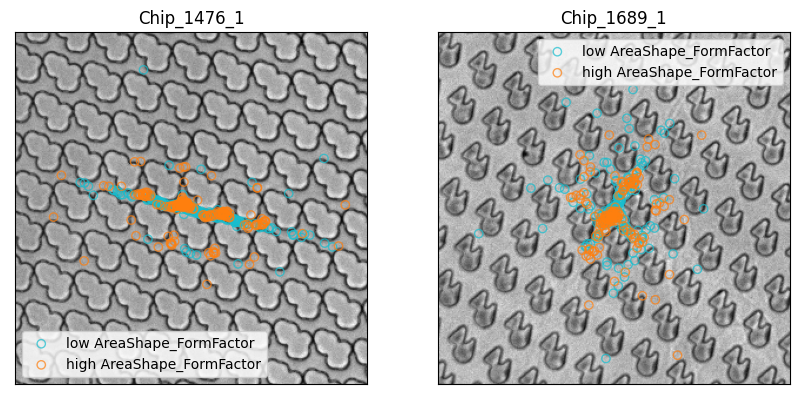

In [78]:
###
# plot a scatterplot of the x and y center of the cell:

# use the dapi df instead of actin:

sources = ['real']
feat_x = 'AreaShape_Center_X'
feat_y = 'AreaShape_Center_Y'
by_feat = 'AreaShape_FormFactor' # 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'

df_combined = df_yap.merge(df_dapi[['ImageNumber','ObjectNumber', 'Metadata_Source', by_feat,
                                    'Metadata_Chip', feat_x, feat_y]],
             left_on=['ImageNumber_nucleus', 'ObjectNumber_nucleus', 'Metadata_Source_nucleus'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_yap', '_dapi')).copy()

qs = [0.25, 0.75]


chips_to_save = ['Chip_1476_1', 'Chip_1689_1'] # chips

num_columns = min(4, len(chips_to_save))
num_rows = int(np.ceil(len(chips_to_save) / num_columns))

fig, axs = plt.subplots(num_rows, num_columns, sharex=True, sharey=True, figsize=(5*num_columns, 5*num_rows), squeeze=False)
colors = ['tab:cyan', 'tab:orange']

for i, chip in enumerate(chips_to_save):
    for k, source in enumerate(sources):
        ax = axs[i // num_columns, i % num_columns]
        data_this = df_combined[df_combined['Metadata_Chip'] == chip + '_' + source]
        bg = load_imgs(path_real_imgs, chip + '_real', ['background'])[0]
        ax.imshow(bg, cmap='gray', origin='lower')
        x = data_this[feat_x]
        y = data_this[feat_y]
        x_low = x[data_this[by_feat] < data_this[by_feat].quantile(qs[0])]
        y_low = y[data_this[by_feat] < data_this[by_feat].quantile(qs[0])]
        x_high = x[data_this[by_feat] > data_this[by_feat].quantile(qs[1])]
        y_high = y[data_this[by_feat] > data_this[by_feat].quantile(qs[1])]
        ax.scatter(x_low, y_low,
                   marker='o', facecolor='none', edgecolor=colors[0], label=f'low {by_feat}', alpha=0.7)
        ax.scatter(x_high, y_high,
                   marker='o',  facecolor='none', edgecolor=colors[1], label=f'high {by_feat}', alpha=0.7)
        # ax.scatter(data_this[feat_x], data_this[feat_y],
        #            marker='o', facecolor=colors[k], edgecolor=colors[k], label=source + f' (corr {corr})', alpha=0.7)
        
        ax.set_title(chip)
        ax.legend()
        ax.set_xticks([])
        ax.set_yticks([])

# plt.title(f'Nucleus locations')
plt.savefig(f'nucl_loc_by_solidity_{sources[0]}.png', transparent=True, bbox_inches='tight')
plt.show()




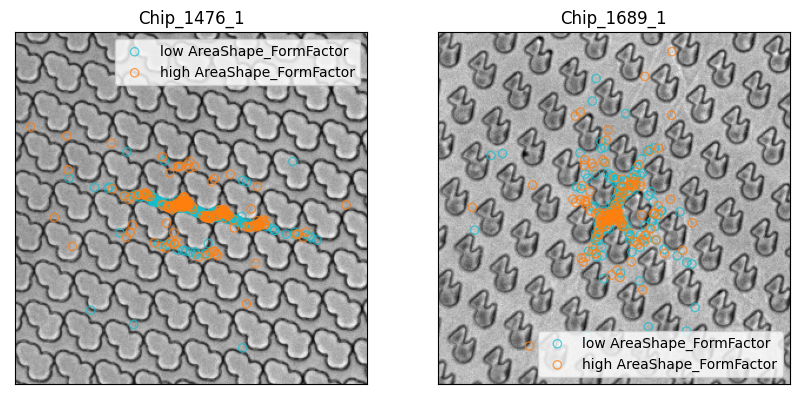

In [79]:
###
# plot a scatterplot of the x and y center of the cell:

# use the dapi df instead of actin:

sources = ['fake']
feat_x = 'AreaShape_Center_X'
feat_y = 'AreaShape_Center_Y'
by_feat = 'AreaShape_FormFactor' # 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'

df_combined = df_yap.merge(df_dapi[['ImageNumber','ObjectNumber', 'Metadata_Source', by_feat,
                                    'Metadata_Chip', feat_x, feat_y]],
             left_on=['ImageNumber_nucleus', 'ObjectNumber_nucleus', 'Metadata_Source_nucleus'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_yap', '_dapi')).copy()

qs = [0.25, 0.75]

chips_to_save = ['Chip_1476_1', 'Chip_1689_1'] # chips

num_columns = min(4, len(chips_to_save))
num_rows = int(np.ceil(len(chips_to_save) / num_columns))

fig, axs = plt.subplots(num_rows, num_columns, sharex=True, sharey=True, figsize=(5*num_columns, 5*num_rows), squeeze=False)
colors = ['tab:cyan', 'tab:orange']

for i, chip in enumerate(chips_to_save):
    for k, source in enumerate(sources):
        ax = axs[i // num_columns, i % num_columns]
        data_this = df_combined[df_combined['Metadata_Chip'] == chip + '_' + source]
        bg = load_imgs(path_real_imgs, chip + '_real', ['background'])[0]
        ax.imshow(bg, cmap='gray', origin='lower')
        x = data_this[feat_x]
        y = data_this[feat_y]
        x_low = x[data_this[by_feat] < data_this[by_feat].quantile(qs[0])]
        y_low = y[data_this[by_feat] < data_this[by_feat].quantile(qs[0])]
        x_high = x[data_this[by_feat] > data_this[by_feat].quantile(qs[1])]
        y_high = y[data_this[by_feat] > data_this[by_feat].quantile(qs[1])]
        ax.scatter(x_low, y_low,
                   marker='o', facecolor='none', edgecolor=colors[0], label=f'low {by_feat}', alpha=0.7)
        ax.scatter(x_high, y_high,
                   marker='o',  facecolor='none', edgecolor=colors[1], label=f'high {by_feat}', alpha=0.7)
        # ax.scatter(data_this[feat_x], data_this[feat_y],
        #            marker='o', facecolor=colors[k], edgecolor=colors[k], label=source + f' (corr {corr})', alpha=0.7)
        
        ax.set_title(chip)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.legend()


# plt.title(f'Nucleus locations')
plt.savefig(f'nucl_loc_by_solidity_{sources[0]}.png', transparent=True, bbox_inches='tight')
plt.show()

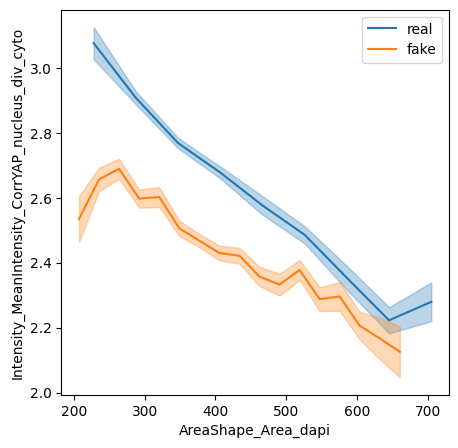

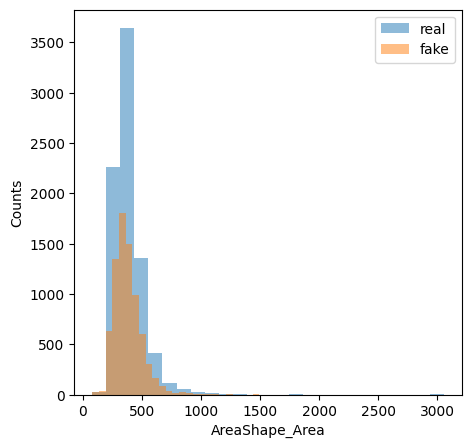

In [113]:
# can we make a histogram of yap in the nucleus for various nuclei solidity levels?
spath = 'bio_corr_plots/'
if not os.path.exists(spath):
    os.makedirs(spath)


sources = ['real',
           'fake'
          ]
colors = 'tab:blue', 'tab:orange'
y_feat = 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto' #'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'
by_feat = 'AreaShape_Area'#'AreaShape_Solidity' # 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'

min_count = 50
num_bins=50
lower_bound_yfeat = -np.inf
def upper(x): return np.mean(x) + np.std(x) / np.sqrt(len(x))  #x.quantile(0.9)
def lower(x): return np.mean(x) - np.std(x) / np.sqrt(len(x))  # x.quantile(0.1)
def log2mean(x): return np.mean(np.log2(x))

# first, join the AreaShape_Solidity column of the dapi df with the yap df based on the ImageNumber_nucleus and ImageNumber columns respectively:
df_combined = df_yap.merge(df_dapi[['ImageNumber','ObjectNumber', 'Metadata_Source', by_feat]],
             left_on=['ImageNumber_nucleus', 'ObjectNumber_nucleus', 'Metadata_Source_nucleus'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_yap', '_dapi')).copy()


df_combined[[y_feat]] = df_combined[[y_feat]].astype(float)
df_combined = df_combined[df_combined[by_feat] >= lower_bound_yfeat]


fig, ax = plt.subplots(1,1, figsize=(5,5))


for i, source in enumerate(sources):
    df_temp = df_combined[df_combined['Metadata_Source_nucleus'].str.contains(source)].copy()

    # now make a plot of solidity on x-axis and yap in nucleus on y-axis:

    bins = pd.cut(df_temp[by_feat], bins=num_bins)
    df_temp['feat_bin'] = bins
    grouped = df_temp[['feat_bin', y_feat]].groupby('feat_bin')[y_feat]
    grouped = grouped.agg(['mean', upper, lower, 'count', log2mean]).dropna()
    grouped = grouped[grouped['count'] >= min_count]

    plt.plot(pd.IntervalIndex(grouped.index).mid.values, grouped['mean'].values, color=colors[i], label=source)
    plt.fill_between(pd.IntervalIndex(grouped.index).mid.values,
                        grouped['lower'].values,
                        grouped['upper'].values,
                        color=colors[i], 
                        alpha=0.3)

plt.legend()
plt.xlabel(by_feat +'_dapi')
plt.ylabel(y_feat)
# plt.xlim(0.8, 1.00)
# plt.ylim(2, 3)
plt.savefig(os.path.join(spath, f'corr_{y_feat}_{by_feat}.pdf'))

plt.show()

# let's also plot a hist of solidity real and fake:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.hist(df_combined[df_combined['Metadata_Source_nucleus'].str.contains('real')][by_feat],
          bins=25, alpha=0.5, color='tab:blue', label='real',
#          density=True
        )
plt.hist(df_combined[df_combined['Metadata_Source_nucleus'].str.contains('fake')][by_feat],
          bins=25, alpha=0.5, color='tab:orange', label='fake',
#          density=True
        )
plt.legend()
plt.xlabel(by_feat)
# plt.xlim(0.75, 1)
plt.ylabel('Counts')
# plt.yscale('log')
plt.show()



## do the same but now for each chip separately:

In [114]:
df_dapi['Metadata_Chip']

0        Chip_1130_1_real
1        Chip_1130_1_real
2        Chip_1130_1_real
3        Chip_1130_1_real
4        Chip_1130_1_real
               ...       
15523    Chip_2113_2_fake
15524    Chip_2113_2_fake
15525    Chip_2113_2_fake
15526    Chip_2113_2_fake
15527    Chip_2113_2_fake
Name: Metadata_Chip, Length: 15528, dtype: object

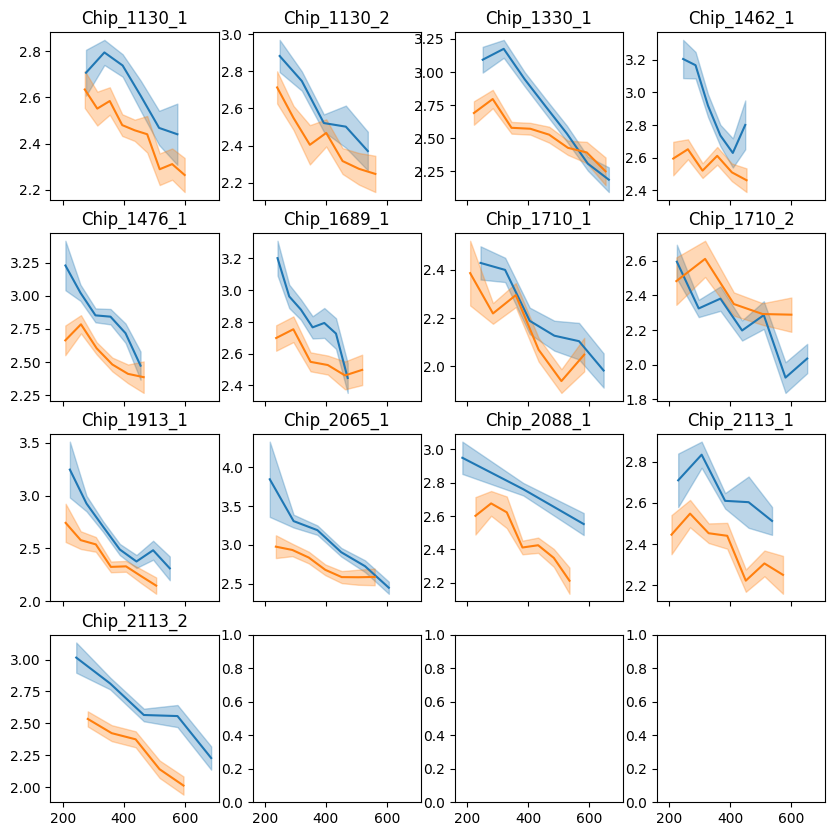

In [104]:
# can we make a histogram of yap in the nucleus for various nuclei solidity levels?
spath = 'bio_corr_plots/'
if not os.path.exists(spath):
    os.makedirs(spath)

fig, axs = plt.subplots(ncols=4, nrows=4, sharex=True, figsize=(10,10))
for chip_iter, chip in enumerate(chips):
    ax = axs.flat[chip_iter]

    sources = ['real', 'fake']
    colors = 'tab:blue', 'tab:orange'
    y_feat = 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto' #'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'
    by_feat = 'AreaShape_Area'#'AreaShape_Solidity' # 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'

    min_count = 20
    num_bins=15
    lower_bound_yfeat = -np.inf
    def upper(x): return np.mean(x) + np.std(x) / np.sqrt(len(x))  #x.quantile(0.9)
    def lower(x): return np.mean(x) - np.std(x) / np.sqrt(len(x))  # x.quantile(0.1)
    def log2mean(x): return np.mean(np.log2(x))

    # first, join the AreaShape_Solidity column of the dapi df with the yap df based on the ImageNumber_nucleus and ImageNumber columns respectively:
    df_combined = df_yap.merge(df_dapi[['ImageNumber','ObjectNumber', 'Metadata_Source', 'Metadata_Chip', by_feat]],
                 left_on=['ImageNumber_nucleus', 'ObjectNumber_nucleus', 'Metadata_Source_nucleus'],
                right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                               suffixes=('_yap', '_dapi')).copy()


    df_combined[[y_feat]] = df_combined[[y_feat]].astype(float)
    df_combined = df_combined[df_combined[by_feat] >= lower_bound_yfeat]
    df_combined = df_combined[df_combined['Metadata_Chip'].str.contains(chip)]


    for i, source in enumerate(sources):
        df_temp = df_combined[df_combined['Metadata_Source_nucleus'].str.contains(source)].copy()

        # now make a plot of solidity on x-axis and yap in nucleus on y-axis:

        bins = pd.cut(df_temp[by_feat], bins=num_bins)
        df_temp['feat_bin'] = bins
        grouped = df_temp[['feat_bin', y_feat]].groupby('feat_bin')[y_feat]
        grouped = grouped.agg(['mean', upper, lower, 'count', log2mean]).dropna()
        grouped = grouped[grouped['count'] >= min_count]

        ax.plot(pd.IntervalIndex(grouped.index).mid.values, grouped['mean'].values, color=colors[i], label=source)
        ax.fill_between(pd.IntervalIndex(grouped.index).mid.values,
                            grouped['lower'].values,
                            grouped['upper'].values,
                            color=colors[i], 
                            alpha=0.3)

#     ax.legend()
#     ax.set_xlabel(by_feat)
#     ax.set_ylabel(y_feat)
    ax.set_title(chip)
    # plt.xlim(0.8, 1.00)
    # plt.ylim(2, 3)
    # plt.savefig(os.path.join(spath, f'corr_{y_feat}_{by_feat}.pdf'))

plt.show()

# # let's also plot a hist of solidity real and fake:
# fig, ax = plt.subplots(1,1, figsize=(5,5))
# plt.hist(df_combined[df_combined['Metadata_Source_nucleus'].str.contains('real')][by_feat],
#           bins=25, alpha=0.5, color='tab:blue', label='real',
# #          density=True
#         )
# plt.hist(df_combined[df_combined['Metadata_Source_nucleus'].str.contains('fake')][by_feat],
#           bins=25, alpha=0.5, color='tab:orange', label='fake',
# #          density=True
#         )
# plt.legend()
# plt.xlabel(by_feat)
# # plt.xlim(0.75, 1)
# plt.ylabel('Counts')
# # plt.yscale('log')
# plt.show()



In [105]:
df_combined['Metadata_Source_nucleus'].str.contains('real').sum()

498

In [106]:
df_combined['Metadata_Source_nucleus'].str.contains('fake').sum()

489

In [107]:
df_dapi[(df_dapi['AreaShape_Solidity'] < 0.6) & (df_dapi['Metadata_Source'] == 'fake')]

,ImageNumber,ObjectNumber,Metadata_Chip,Metadata_FileLocation,Metadata_Frame,Metadata_Obj_id,Metadata_Series,Metadata_Source,Metadata_Source_folder,Metadata_Stain,...,Texture_Variance_CorrCellBody_3_00_256,Texture_Variance_CorrCellBody_3_01_256,Texture_Variance_CorrCellBody_3_02_256,Texture_Variance_CorrCellBody_3_03_256,Texture_Variance_CorrDNA_3_00_256,Texture_Variance_CorrDNA_3_01_256,Texture_Variance_CorrDNA_3_02_256,Texture_Variance_CorrDNA_3_03_256,Count,mask_to_keep
9793,2076,1,Chip_1330_1_fake,NaN,0,708,0,fake,generated_images_tiff_inject_newpreproc,NaN,...,0.0,0.0,0.0,0.0,3.16,1.333333,0.65,4.805556,1,True
10216,2571,1,Chip_1462_1_fake,NaN,0,366,0,fake,generated_images_tiff_inject_newpreproc,NaN,...,23.731289,13.9255,17.77284,17.856327,0.0,0.84,0.109375,0.0,1,True
12433,5085,1,Chip_1710_2_fake,NaN,0,146,0,fake,generated_images_tiff_inject_newpreproc,NaN,...,0.21551,0.239481,0.247659,0.25,0.0,0.0,0.0,0.0,1,True


In [108]:
test = df_yap.merge(df_dapi[['ImageNumber','ObjectNumber', 'Metadata_Source', 'AreaShape_Solidity']],
             left_on=['ImageNumber_nucleus', 'ObjectNumber_nucleus', 'Metadata_Source_nucleus'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_yap', '_dapi')).copy()

In [109]:
test['Metadata_Source_nucleus'].str.contains('fake').sum()

7611

In [110]:
# correlation analysis of yap localization wrt cell shape determinants

In [111]:
df_combined_full = df_yap.merge(df_dapi,
             left_on=['ImageNumber_nucleus', 'ObjectNumber_nucleus', 'Metadata_Source_nucleus'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_yap', '_dapi')).copy()

# keep only real:
df_combined_full = df_combined_full[df_combined_full.Metadata_Source_nucleus=='real']

# convert to numeric where applicable
df_combined_full = df_combined_full.apply(pd.to_numeric, errors='coerce').fillna(df_combined_full)
df_combined_full[[y_feat]] = df_combined_full[[y_feat]].astype(float)
c = df_combined_full.corr(numeric_only=True, method='spearman')

In [41]:
# df_combined_full[y_feat]

In [42]:
c.abs().unstack().sort_values()[(~c.abs().unstack().sort_values().isna()) & (c.abs().unstack().sort_values() < 0.98)]

Texture_Entropy_CorrCellBody_3_00_256            Location_MaxIntensity_X_CorrDNA                    0.000001
                                                 Location_MaxIntensity_X_CorrDNA_nucleus            0.000001
Location_MaxIntensity_X_CorrDNA                  Texture_Entropy_CorrCellBody_3_00_256              0.000001
Location_MaxIntensity_X_DNA_nucleus              Texture_Entropy_CorrCellBody_3_00_256              0.000001
Location_MaxIntensity_X_DNA                      Texture_Entropy_CorrCellBody_3_00_256              0.000001
                                                                                                      ...   
Location_MaxIntensity_Y_CorrYAP_nucleus          Location_CenterMassIntensity_Y_CellBody_nucleus    0.979925
Location_CenterMassIntensity_Y_CellBody          Location_MaxIntensity_Y_CorrYAP_nucleus            0.979925
                                                 Location_MaxIntensity_Y_CorrYAP                    0.979925
Location_CenterMass

In [43]:
corrs_y_feat = c[c.columns.str.contains(y_feat)].T[y_feat].sort_values()

In [44]:
corrs_y_feat = corrs_y_feat[~corrs_y_feat.isna()]

In [45]:
corrs_y_feat.tail(20)

Intensity_LowerQuartileIntensity_CorrCellBody_nucleus    0.293658
Intensity_MeanIntensity_CorrYAP                          0.296396
Intensity_MeanIntensity_CorrYAP_nucleus                  0.296396
Intensity_UpperQuartileIntensity_YAP_nucleus             0.299444
Intensity_UpperQuartileIntensity_YAP                     0.299444
Intensity_MaxIntensity_CorrYAP_nucleus                   0.301081
Intensity_MaxIntensity_CorrYAP                           0.301081
Intensity_MeanIntensityEdge_CorrCellBody                 0.301147
Intensity_MeanIntensityEdge_CorrCellBody_nucleus         0.301147
Intensity_UpperQuartileIntensity_CorrYAP_nucleus         0.304039
Intensity_UpperQuartileIntensity_CorrYAP                 0.304039
Intensity_StdIntensity_YAP_nucleus                       0.309321
Intensity_StdIntensity_YAP                               0.309321
Intensity_StdIntensity_CorrYAP                           0.311806
Intensity_StdIntensity_CorrYAP_nucleus                   0.311806
Intensity_

In [46]:
y_feat = 'Intensity_MeanIntensity_CorrCellBody'

df_combined_full = df_actin[['ImageNumber', 'ObjectNumber', 'Metadata_Source', y_feat]].merge(df_dapi,
             left_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_actin', '_dapi')).copy()

# keep only real:
df_combined_full = df_combined_full[df_combined_full.Metadata_Source=='real']

# convert to numeric where applicable
y_feat = y_feat + '_actin'

df_combined_full = df_combined_full.apply(pd.to_numeric, errors='coerce').fillna(df_combined_full)
df_combined_full[[y_feat]] = df_combined_full[[y_feat]].astype(float)
c = df_combined_full.corr(numeric_only=True, method='spearman')

In [47]:
corrs_y_feat = c[c.columns.str.contains(y_feat)].T[y_feat].sort_values()
corrs_y_feat = corrs_y_feat[~corrs_y_feat.isna()]
corrs_y_feat[corrs_y_feat.index.str.contains('Area')].head(20)

AreaShape_FormFactor    -0.231096
AreaShape_Zernike_0_0   -0.211184
AreaShape_Extent        -0.189878
AreaShape_Solidity      -0.157864
AreaShape_Zernike_1_1   -0.096335
AreaShape_Zernike_7_1   -0.079335
AreaShape_Zernike_8_6   -0.073629
AreaShape_Zernike_5_5   -0.056015
AreaShape_Zernike_9_7   -0.053522
AreaShape_Zernike_2_0   -0.050487
AreaShape_Zernike_3_3   -0.050320
AreaShape_Zernike_7_5   -0.046662
AreaShape_Zernike_7_3   -0.042980
AreaShape_Zernike_9_9   -0.039885
AreaShape_Zernike_7_7   -0.035866
AreaShape_Zernike_9_5   -0.035184
AreaShape_Zernike_5_3   -0.034010
AreaShape_Zernike_9_1   -0.034002
AreaShape_Zernike_6_2   -0.032398
AreaShape_Zernike_2_2   -0.030735
Name: Intensity_MeanIntensity_CorrCellBody_actin, dtype: float64

In [86]:
df_dapi.columns[df_dapi.columns.str.contains('Area')]

Index(['AreaShape_Area', 'AreaShape_BoundingBoxArea',
       'AreaShape_BoundingBoxMaximum_X', 'AreaShape_BoundingBoxMaximum_Y',
       'AreaShape_BoundingBoxMinimum_X', 'AreaShape_BoundingBoxMinimum_Y',
       'AreaShape_Center_X', 'AreaShape_Center_Y', 'AreaShape_Compactness',
       'AreaShape_ConvexArea', 'AreaShape_Eccentricity',
       'AreaShape_EquivalentDiameter', 'AreaShape_EulerNumber',
       'AreaShape_Extent', 'AreaShape_FormFactor', 'AreaShape_MajorAxisLength',
       'AreaShape_MaxFeretDiameter', 'AreaShape_MaximumRadius',
       'AreaShape_MeanRadius', 'AreaShape_MedianRadius',
       'AreaShape_MinFeretDiameter', 'AreaShape_MinorAxisLength',
       'AreaShape_Orientation', 'AreaShape_Perimeter', 'AreaShape_Solidity',
       'AreaShape_Zernike_0_0', 'AreaShape_Zernike_1_1',
       'AreaShape_Zernike_2_0', 'AreaShape_Zernike_2_2',
       'AreaShape_Zernike_3_1', 'AreaShape_Zernike_3_3',
       'AreaShape_Zernike_4_0', 'AreaShape_Zernike_4_2',
       'AreaShape_Zernike_4

In [50]:
y_feat = 'AreaShape_FormFactor'

df_combined_full = df_dapi[['ImageNumber', 'ObjectNumber', 'Metadata_Source', y_feat]].merge(df_actin,
             left_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_dapi', '_actin')).copy()

# keep only real:
df_combined_full = df_combined_full[df_combined_full.Metadata_Source=='real']

# convert to numeric where applicable
y_feat = y_feat + '_dapi'

df_combined_full = df_combined_full.apply(pd.to_numeric, errors='coerce').fillna(df_combined_full)
df_combined_full[[y_feat]] = df_combined_full[[y_feat]].astype(float)
c = df_combined_full.corr(numeric_only=True, method='spearman')

In [51]:
corrs_y_feat = c[c.columns.str.contains(y_feat)].T[y_feat].sort_values()
corrs_y_feat = corrs_y_feat[~corrs_y_feat.isna()]
corrs_y_feat.tail(20)  # [corrs_y_feat.index.str.contains('Area')]

Texture_InfoMeas1_CorrDNA_3_01_256      0.189534
AreaShape_Zernike_9_5                   0.190016
AreaShape_Zernike_9_7                   0.190774
AreaShape_MinorAxisLength               0.192404
AreaShape_Zernike_2_0                   0.193356
AreaShape_Zernike_9_9                   0.195155
AreaShape_Zernike_7_1                   0.199127
AreaShape_Zernike_7_3                   0.200046
AreaShape_Zernike_7_7                   0.202108
Texture_Correlation_CorrDNA_3_01_256    0.211292
AreaShape_Zernike_7_5                   0.212247
AreaShape_Zernike_5_3                   0.219081
AreaShape_Zernike_3_3                   0.221608
AreaShape_Zernike_5_5                   0.223169
AreaShape_Zernike_5_1                   0.223658
Texture_Correlation_CorrDNA_3_02_256    0.223873
AreaShape_Zernike_3_1                   0.246943
AreaShape_Zernike_1_1                   0.248477
AreaShape_Zernike_0_0                   0.260837
AreaShape_FormFactor_dapi               1.000000
Name: AreaShape_Form

In [52]:
corrs_y_feat.head(20)

ImageNumber                                       -0.307450
AreaShape_Eccentricity                            -0.291645
Texture_Contrast_CorrCellBody_3_01_256            -0.256034
Texture_DifferenceEntropy_CorrCellBody_3_01_256   -0.253649
Texture_Contrast_CorrCellBody_3_02_256            -0.252848
Texture_DifferenceEntropy_CorrCellBody_3_02_256   -0.251330
Texture_Variance_CorrCellBody_3_02_256            -0.244494
Texture_Variance_CorrCellBody_3_03_256            -0.243175
Texture_Variance_CorrCellBody_3_00_256            -0.242913
Texture_Entropy_CorrCellBody_3_02_256             -0.242766
Texture_Variance_CorrCellBody_3_01_256            -0.241822
AreaShape_MajorAxisLength                         -0.241697
Texture_SumVariance_CorrCellBody_3_03_256         -0.241524
Intensity_StdIntensity_CorrCellBody               -0.241419
Texture_SumVariance_CorrCellBody_3_00_256         -0.240794
Texture_Contrast_CorrCellBody_3_00_256            -0.240560
Texture_Entropy_CorrCellBody_3_01_256   

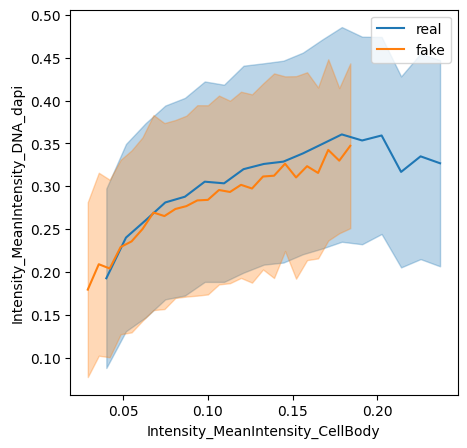

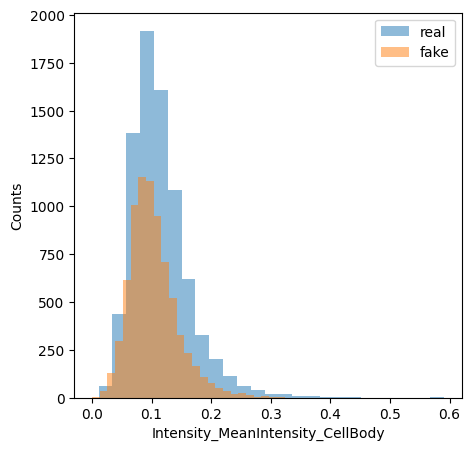

In [190]:
# can we make a histogram of yap in the nucleus for various nuclei solidity levels?
spath = 'bio_corr_plots/'
if not os.path.exists(spath):
    os.makedirs(spath)


sources = ['real', 
           'fake'
          ]
colors = 'tab:blue', 'tab:orange'
y_feat = 'Intensity_MeanIntensity_DNA' #'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'
by_feat = 'Intensity_MeanIntensity_CellBody'
min_count = 50
num_bins=50
lower_bound_yfeat = -np.inf
def upper(x): return np.mean(x) + np.std(x) #/ np.sqrt(len(x))  #x.quantile(0.9)
def lower(x): return np.mean(x) - np.std(x) #/ np.sqrt(len(x))  # x.quantile(0.1)
def log2mean(x): return np.mean(np.log2(x))

# first, join the AreaShape_Solidity column of the dapi df with the yap df based on the ImageNumber_nucleus and ImageNumber columns respectively:
df_combined = df_dapi[['ImageNumber', 'ObjectNumber', 'Metadata_Source', y_feat]].merge(df_actin,
             left_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_dapi', '_actin')).copy()

y_feat = y_feat + '_dapi'
# by_feat = by_feat + '_actin'
df_combined[[y_feat]] = df_combined[[y_feat]].astype(float)
# df_combined = df_combined[df_combined[by_feat] >= lower_bound_yfeat]


fig, ax = plt.subplots(1,1, figsize=(5,5))


for i, source in enumerate(sources):
    df_temp = df_combined[df_combined['Metadata_Source'].str.contains(source)].copy()

    # now make a plot of solidity on x-axis and yap in nucleus on y-axis:

    bins = pd.cut(df_temp[by_feat], bins=num_bins)
    df_temp['feat_bin'] = bins
    grouped = df_temp[['feat_bin', y_feat]].groupby('feat_bin')[y_feat]
    grouped = grouped.agg(['mean', upper, lower, 'count', log2mean]).dropna()
    grouped = grouped[grouped['count'] >= min_count]

    plt.plot(pd.IntervalIndex(grouped.index).mid.values, grouped['mean'].values, color=colors[i], label=source)
    plt.fill_between(pd.IntervalIndex(grouped.index).mid.values,
                        grouped['lower'].values,
                        grouped['upper'].values,
                        color=colors[i], 
                        alpha=0.3)

plt.legend()
plt.xlabel(by_feat)
plt.ylabel(y_feat)
# plt.xlim(0, 0.04)
# plt.ylim(0.66, 0.8)
plt.savefig(os.path.join(spath, f'corr_{y_feat}_{by_feat}.pdf'))

plt.show()

# let's also plot a hist of solidity real and fake:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('real')][by_feat],
          bins=25, alpha=0.5, color='tab:blue', label='real',
#          density=True
        )
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('fake')][by_feat],
          bins=25, alpha=0.5, color='tab:orange', label='fake',
#          density=True
        )
plt.legend()
plt.xlabel(by_feat)
# plt.xlim(0, 0.025)
plt.ylabel('Counts')
# plt.yscale('log')
plt.show()



In [54]:
df_dapi.columns[df_dapi.columns.str.contains('Intensity')]

Index(['Intensity_IntegratedIntensityEdge_CellBody',
       'Intensity_IntegratedIntensityEdge_CorrCellBody',
       'Intensity_IntegratedIntensityEdge_CorrDNA',
       'Intensity_IntegratedIntensityEdge_CorrYAP',
       'Intensity_IntegratedIntensityEdge_DNA',
       'Intensity_IntegratedIntensityEdge_YAP',
       'Intensity_IntegratedIntensity_CellBody',
       'Intensity_IntegratedIntensity_CorrCellBody',
       'Intensity_IntegratedIntensity_CorrDNA',
       'Intensity_IntegratedIntensity_CorrYAP',
       ...
       'Location_MaxIntensity_Y_CorrDNA', 'Location_MaxIntensity_Y_CorrYAP',
       'Location_MaxIntensity_Y_DNA', 'Location_MaxIntensity_Y_YAP',
       'Location_MaxIntensity_Z_CellBody',
       'Location_MaxIntensity_Z_CorrCellBody',
       'Location_MaxIntensity_Z_CorrDNA', 'Location_MaxIntensity_Z_CorrYAP',
       'Location_MaxIntensity_Z_DNA', 'Location_MaxIntensity_Z_YAP'],
      dtype='object', length=126)

## Dapi median dapi intensity (y) vs nucleus shape features

C:\Users\s161975\Anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\s161975\Anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


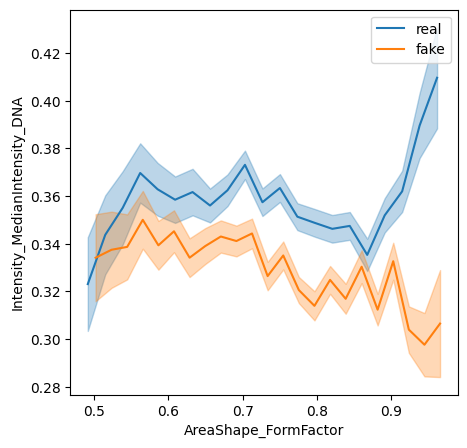

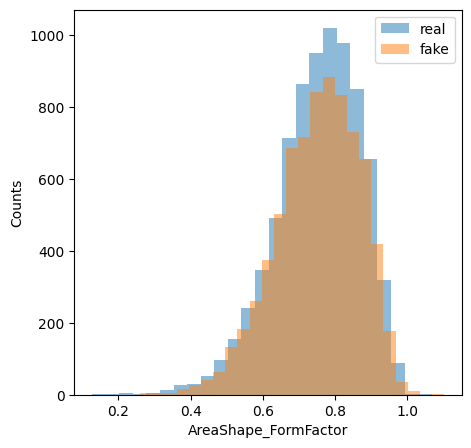

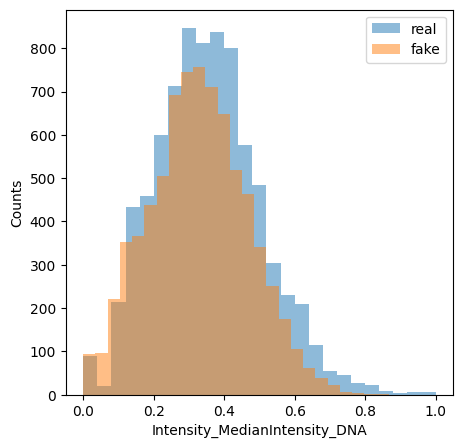

In [141]:
# can we make a histogram of yap in the nucleus for various nuclei solidity levels?
spath = 'bio_corr_plots/'
if not os.path.exists(spath):
    os.makedirs(spath)


sources = ['real', 'fake']
colors = 'tab:blue', 'tab:orange'
y_feat = 'Intensity_MedianIntensity_DNA' 
by_feat = 'AreaShape_FormFactor'

min_count = 50
num_bins=40
lower_bound_yfeat = -np.inf
def upper(x): return np.mean(x) + np.std(x) / np.sqrt(len(x))  #x.quantile(0.9)
def lower(x): return np.mean(x) - np.std(x) / np.sqrt(len(x))  # x.quantile(0.1)
def log2mean(x): return np.mean(np.log2(x))

# first, join the AreaShape_Solidity column of the dapi df with the yap df based on the ImageNumber_nucleus and ImageNumber columns respectively:
df_combined = df_dapi.copy()


df_combined[[y_feat]] = df_combined[[y_feat]].astype(float)
df_combined = df_combined[df_combined[by_feat] >= lower_bound_yfeat]


fig, ax = plt.subplots(1,1, figsize=(5,5))


for i, source in enumerate(sources):
    df_temp = df_combined[df_combined['Metadata_Source'].str.contains(source)].copy()

    # now make a plot of solidity on x-axis and yap in nucleus on y-axis:

    bins = pd.cut(df_temp[by_feat], bins=num_bins)
    df_temp['feat_bin'] = bins
    grouped = df_temp[['feat_bin', y_feat]].groupby('feat_bin')[y_feat]
    grouped = grouped.agg(['mean', upper, lower, 'count', log2mean]).dropna()
    grouped = grouped[grouped['count'] >= min_count]

    plt.plot(pd.IntervalIndex(grouped.index).mid.values, grouped['mean'].values, color=colors[i], label=source)
    plt.fill_between(pd.IntervalIndex(grouped.index).mid.values,
                        grouped['lower'].values,
                        grouped['upper'].values,
                        color=colors[i], 
                        alpha=0.3)

plt.legend()
plt.xlabel(by_feat)
plt.ylabel(y_feat)
# plt.xlim(0.8, 1.00)
# plt.ylim(2, 3)
plt.savefig(os.path.join(spath, f'corr_{y_feat}_{by_feat}_dapi.pdf'))

plt.show()

# let's also plot a hist of feats for real and fake:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('real')][by_feat],
          bins=25, alpha=0.5, color='tab:blue', label='real',
#          density=True
        )
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('fake')][by_feat],
          bins=25, alpha=0.5, color='tab:orange', label='fake',
#          density=True
        )
plt.legend()
plt.xlabel(by_feat)
# plt.xlim(0.75, 1)
plt.ylabel('Counts')
# plt.yscale('log')
plt.show()

# let's also plot a hist of feats for real and fake:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('real')][y_feat],
          bins=25, alpha=0.5, color='tab:blue', label='real',
#          density=True
        )
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('fake')][y_feat],
          bins=25, alpha=0.5, color='tab:orange', label='fake',
#          density=True
        )
plt.legend()
plt.xlabel(y_feat)
# plt.xlim(0.75, 1)
plt.ylabel('Counts')
# plt.yscale('log')
plt.show()




In [126]:
df_combined.columns[df_combined.columns.str.contains('MedianIntensity')]

Index(['Intensity_MedianIntensity_CellBody',
       'Intensity_MedianIntensity_CorrCellBody',
       'Intensity_MedianIntensity_CorrDNA',
       'Intensity_MedianIntensity_CorrYAP', 'Intensity_MedianIntensity_DNA',
       'Intensity_MedianIntensity_YAP'],
      dtype='object')

## Cell area vs nuclear area

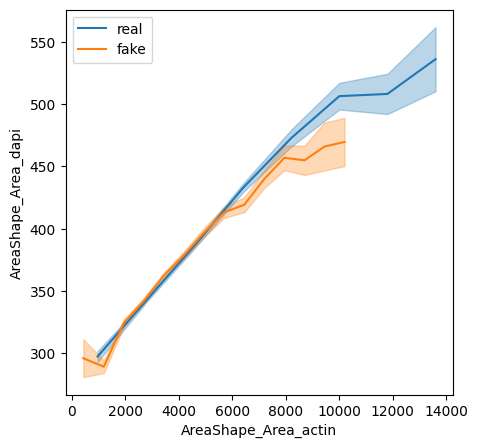

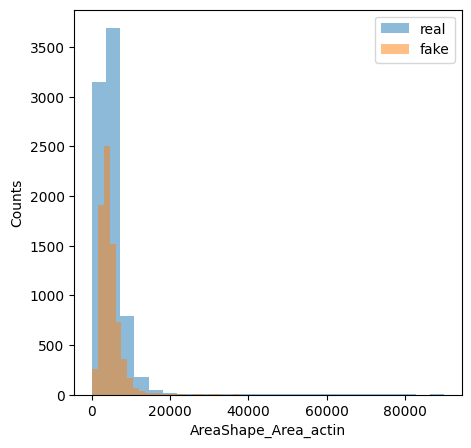

In [136]:
# can we make a histogram of yap in the nucleus for various nuclei solidity levels?
spath = 'bio_corr_plots/'
if not os.path.exists(spath):
    os.makedirs(spath)


sources = ['real', 
           'fake'
          ]
colors = 'tab:blue', 'tab:orange'
y_feat = 'AreaShape_Area' #'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'
by_feat = 'AreaShape_Area'
min_count = 50
num_bins=50
lower_bound_yfeat = -np.inf
def upper(x): return np.mean(x) + np.std(x) / np.sqrt(len(x))  #x.quantile(0.9)
def lower(x): return np.mean(x) - np.std(x) / np.sqrt(len(x))  # x.quantile(0.1)
def log2mean(x): return np.mean(np.log2(x))

# first, join the AreaShape_Solidity column of the dapi df with the yap df based on the ImageNumber_nucleus and ImageNumber columns respectively:
df_combined = df_dapi[['ImageNumber', 'ObjectNumber', 'Metadata_Source', y_feat]].merge(df_actin,
             left_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_dapi', '_actin')).copy()

y_feat = y_feat + '_dapi'
by_feat = by_feat + '_actin'
df_combined[[y_feat]] = df_combined[[y_feat]].astype(float)
# df_combined = df_combined[df_combined[by_feat] >= lower_bound_yfeat]


fig, ax = plt.subplots(1,1, figsize=(5,5))


for i, source in enumerate(sources):
    df_temp = df_combined[df_combined['Metadata_Source'].str.contains(source)].copy()

    # now make a plot of solidity on x-axis and yap in nucleus on y-axis:

    bins = pd.cut(df_temp[by_feat], bins=num_bins)
    df_temp['feat_bin'] = bins
    grouped = df_temp[['feat_bin', y_feat]].groupby('feat_bin')[y_feat]
    grouped = grouped.agg(['mean', upper, lower, 'count', log2mean]).dropna()
    grouped = grouped[grouped['count'] >= min_count]

    plt.plot(pd.IntervalIndex(grouped.index).mid.values, grouped['mean'].values, color=colors[i], label=source)
    plt.fill_between(pd.IntervalIndex(grouped.index).mid.values,
                        grouped['lower'].values,
                        grouped['upper'].values,
                        color=colors[i], 
                        alpha=0.3)

plt.legend()
plt.xlabel(by_feat)
plt.ylabel(y_feat)
# plt.xlim(0, 15000)
# plt.ylim(0.66, 0.8)
plt.savefig(os.path.join(spath, f'corr_{y_feat}_{by_feat}.pdf'))

plt.show()

# let's also plot a hist of solidity real and fake:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('real')][by_feat],
          bins=25, alpha=0.5, color='tab:blue', label='real',
#          density=True
        )
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('fake')][by_feat],
          bins=25, alpha=0.5, color='tab:orange', label='fake',
#          density=True
        )
plt.legend()
plt.xlabel(by_feat)
# plt.xlim(0.75, 1)
plt.ylabel('Counts')
# plt.yscale('log')
plt.show()



## Yap integrated intensity in nucleus vs integrated dapi pixel intesity

C:\Users\s161975\Anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


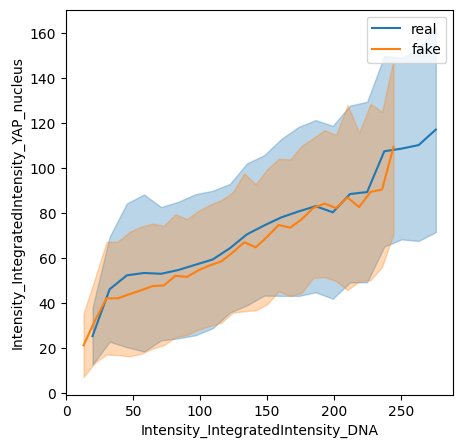

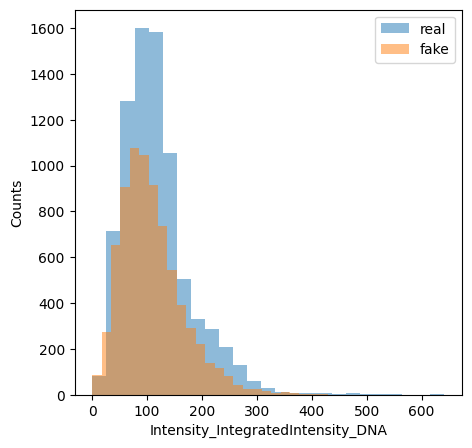

In [140]:
# can we make a histogram of yap in the nucleus for various nuclei solidity levels?
spath = 'bio_corr_plots/'
if not os.path.exists(spath):
    os.makedirs(spath)


sources = ['real', 
           'fake'
          ]
colors = 'tab:blue', 'tab:orange'
y_feat = 'Intensity_IntegratedIntensity_YAP_nucleus' #'Intensity_IntegratedIntensity_CorrYAP_nucleus' #'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'
by_feat = 'Intensity_IntegratedIntensity_DNA' #'AreaShape_Solidity' # 'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'

min_count = 50
num_bins=50
lower_bound_yfeat = -np.inf
def upper(x): return np.mean(x) + np.std(x) #/ np.sqrt(len(x))  #x.quantile(0.9)
def lower(x): return np.mean(x) - np.std(x) #/ np.sqrt(len(x))  # x.quantile(0.1)
def log2mean(x): return np.mean(np.log2(x))

# first, join the AreaShape_Solidity column of the dapi df with the yap df based on the ImageNumber_nucleus and ImageNumber columns respectively:
df_combined = df_yap.merge(df_dapi[['ImageNumber','ObjectNumber', 'Metadata_Source', by_feat]],
             left_on=['ImageNumber_nucleus', 'ObjectNumber_nucleus', 'Metadata_Source_nucleus'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_yap', '_dapi')).copy()


df_combined[[y_feat]] = df_combined[[y_feat]].astype(float)
df_combined = df_combined[df_combined[by_feat] >= lower_bound_yfeat]


fig, ax = plt.subplots(1,1, figsize=(5,5))


for i, source in enumerate(sources):
    df_temp = df_combined[df_combined['Metadata_Source_nucleus'].str.contains(source)].copy()

    # now make a plot of solidity on x-axis and yap in nucleus on y-axis:

    bins = pd.cut(df_temp[by_feat], bins=num_bins)
    df_temp['feat_bin'] = bins
    grouped = df_temp[['feat_bin', y_feat]].groupby('feat_bin')[y_feat]
    grouped = grouped.agg(['mean', upper, lower, 'count', log2mean]).dropna()
    grouped = grouped[grouped['count'] >= min_count]

    plt.plot(pd.IntervalIndex(grouped.index).mid.values, grouped['mean'].values, color=colors[i], label=source)
    plt.fill_between(pd.IntervalIndex(grouped.index).mid.values,
                        grouped['lower'].values,
                        grouped['upper'].values,
                        color=colors[i], 
                        alpha=0.3)

plt.legend()
plt.xlabel(by_feat)
plt.ylabel(y_feat)
# plt.xlim(0.4, 0.65)
# plt.ylim(1, 4)
plt.savefig(os.path.join(spath, f'corr_{y_feat}_{by_feat}.pdf'))

plt.show()

# let's also plot a hist of solidity real and fake:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.hist(df_combined[df_combined['Metadata_Source_nucleus'].str.contains('real')][by_feat],
          bins=25, alpha=0.5, color='tab:blue', label='real',
#          density=True
        )
plt.hist(df_combined[df_combined['Metadata_Source_nucleus'].str.contains('fake')][by_feat],
          bins=25, alpha=0.5, color='tab:orange', label='fake',
#          density=True
        )
plt.legend()
plt.xlabel(by_feat)
# plt.xlim(0.75, 1)
plt.ylabel('Counts')
# plt.yscale('log')
plt.show()



## Actin std intensity - formfactor

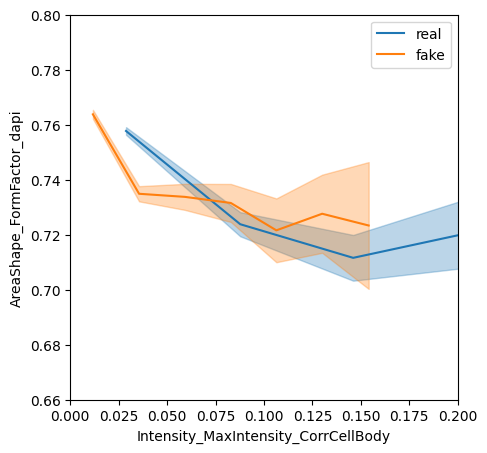

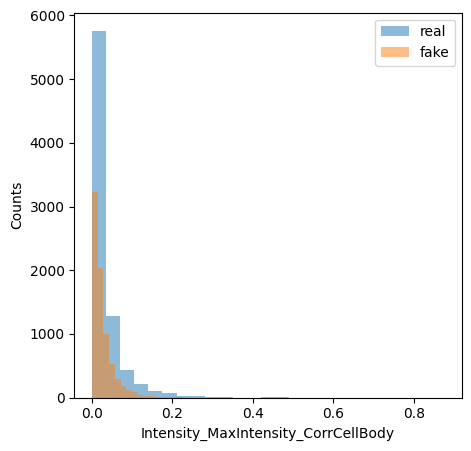

In [173]:
# can we make a histogram of yap in the nucleus for various nuclei solidity levels?
spath = 'bio_corr_plots/'
if not os.path.exists(spath):
    os.makedirs(spath)


sources = ['real', 
           'fake'
          ]
colors = 'tab:blue', 'tab:orange'
y_feat = 'AreaShape_FormFactor' #'Intensity_MeanIntensity_CorrYAP_nucleus_div_cyto'
by_feat = 'Intensity_MaxIntensity_CorrCellBody'
min_count = 20
num_bins=15
lower_bound_yfeat = -np.inf
def upper(x): return np.mean(x) + np.std(x) / np.sqrt(len(x))  #x.quantile(0.9)
def lower(x): return np.mean(x) - np.std(x) / np.sqrt(len(x))  # x.quantile(0.1)
def log2mean(x): return np.mean(np.log2(x))

# first, join the AreaShape_Solidity column of the dapi df with the yap df based on the ImageNumber_nucleus and ImageNumber columns respectively:
df_combined = df_dapi[['ImageNumber', 'ObjectNumber', 'Metadata_Source', y_feat]].merge(df_actin,
             left_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
            right_on=['ImageNumber', 'ObjectNumber', 'Metadata_Source'],
                           suffixes=('_dapi', '_actin')).copy()

y_feat = y_feat + '_dapi'
by_feat = by_feat #+ '_actin'
df_combined[[y_feat]] = df_combined[[y_feat]].astype(float)
# df_combined = df_combined[df_combined[by_feat] >= lower_bound_yfeat]


fig, ax = plt.subplots(1,1, figsize=(5,5))


for i, source in enumerate(sources):
    df_temp = df_combined[df_combined['Metadata_Source'].str.contains(source)].copy()

    # now make a plot of solidity on x-axis and yap in nucleus on y-axis:

    bins = pd.cut(df_temp[by_feat], bins=num_bins)
    df_temp['feat_bin'] = bins
    grouped = df_temp[['feat_bin', y_feat]].groupby('feat_bin')[y_feat]
    grouped = grouped.agg(['mean', upper, lower, 'count', log2mean]).dropna()
    grouped = grouped[grouped['count'] >= min_count]

    plt.plot(pd.IntervalIndex(grouped.index).mid.values, grouped['mean'].values, color=colors[i], label=source)
    plt.fill_between(pd.IntervalIndex(grouped.index).mid.values,
                        grouped['lower'].values,
                        grouped['upper'].values,
                        color=colors[i], 
                        alpha=0.3)

plt.legend()
plt.xlabel(by_feat)
plt.ylabel(y_feat)
plt.xlim(0, 0.2)
plt.ylim(0.66, 0.8)
plt.savefig(os.path.join(spath, f'corr_{y_feat}_{by_feat}.pdf'))

plt.show()

# let's also plot a hist of solidity real and fake:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('real')][by_feat],
          bins=25, alpha=0.5, color='tab:blue', label='real',
#          density=True
        )
plt.hist(df_combined[df_combined['Metadata_Source'].str.contains('fake')][by_feat],
          bins=25, alpha=0.5, color='tab:orange', label='fake',
#          density=True
        )
plt.legend()
plt.xlabel(by_feat)
# plt.xlim(0, 0.025)
plt.ylabel('Counts')
# plt.yscale('log')
plt.show()



In [58]:
df_yap.columns[(df_yap.columns.str.contains('IntegratedIntensity')) & (df_yap.columns.str.contains('YAP'))]

Index(['Intensity_IntegratedIntensityEdge_CorrYAP_nucleus',
       'Intensity_IntegratedIntensityEdge_YAP_nucleus',
       'Intensity_IntegratedIntensity_CorrYAP_nucleus',
       'Intensity_IntegratedIntensity_YAP_nucleus',
       'Intensity_IntegratedIntensityEdge_CorrYAP_cyto',
       'Intensity_IntegratedIntensity_CorrYAP_cyto',
       'Intensity_IntegratedIntensity_YAP_cyto',
       'Intensity_IntegratedIntensity_CorrYAP_nucleus_div_cyto'],
      dtype='object')

In [59]:
df_dapi.columns[(df_dapi.columns.str.contains('IntegratedIntensity')) & (df_dapi.columns.str.contains('DNA'))]

Index(['Intensity_IntegratedIntensityEdge_CorrDNA',
       'Intensity_IntegratedIntensityEdge_DNA',
       'Intensity_IntegratedIntensity_CorrDNA',
       'Intensity_IntegratedIntensity_DNA'],
      dtype='object')

In [60]:
df_ind_feats = df_actin[['AreaShape_Area', 'AreaShape_Eccentricity',  'AreaShape_Perimeter', 'AreaShape_Solidity']]
feats = ['Intensity_IntegratedIntensity_CorrYAP', 'Intensity_MeanIntensity_CorrYAP']
suffices = ['_nucleus_div_cyto']
feats = [i + j for i,j in itertools.product(feats, suffices)]
df_dep = df_yap[feats]


np.corrcoef(df_ind_feats.values, df_dep.values, rowvar=False)

AttributeError: 'float' object has no attribute 'shape'

In [ ]:
df_yap

In [ ]:
df_actin

In [ ]:
# ###
# # plot a hist2d of the x and y center of the cell:

# feat_x = 'AreaShape_Center_X'
# feat_y = 'AreaShape_Center_Y'
# num_columns = 4
# num_rows = int(np.ceil(len(chips) / num_columns))

# fig, axs = plt.subplots(num_rows, num_columns, sharex=True, sharey=True, figsize=(5*num_columns, 5*num_rows), squeeze=False)
# colors = ['tab:green', 'tab:orange']

# for i, chip in enumerate(chips):
#     for k, source in enumerate(sources):
#         ax = axs[i // num_columns, i % num_columns]
#         data_this = df[df['Metadata_Chip'] == chip + '_' + source]
#         bg = load_imgs('real_images_22-10 - all', chip + '_real', ['background'])[0]
#         ax.imshow(bg, cmap='gray')
# #         ax.hist2d(data_this[feat_x], data_this[feat_y], bins=50, alpha=0.5)
#         sns.kdeplot(x=data_this[feat_x].values.astype(float), y=data_this[feat_y].values.astype(float),
#                     ax=ax, label=source, gridsize=150,
#                    fill=True, alpha=0.5, clip=(0, 300)).set(xlim=(0, 300), ylim=(0, 300))
#         ax.set_title(chip)
#         ax.legend()

# plt.savefig('center_on_bg_kde.png')
# plt.show()

In [ ]:
# location on the topography influences nucleus and cell shape:

df = df_dapi

feat_x = 'AreaShape_Center_X'
feat_y = 'AreaShape_Center_Y'
num_columns = 4
num_rows = len(chips)
num_bins= 20
num_samples = num_columns-1
xrange= (100, 200)
yrange=(100, 200)
stain='DAPI'
source_fold = "real_images_22-10 - all"
source= 'real'


def random_select(arr, num=1):
    num = min(num, len(arr))
    return np.random.choice(arr, size=num, replace=False)

fig, axs = plt.subplots(num_rows, num_columns, sharex=True, sharey=True, figsize=(5*num_columns, 5*num_rows), squeeze=False)
colors = ['tab:green', 'tab:orange']

for i, chip in tqdm(enumerate(chips), total=len(chips)):
    for k, source in enumerate(sources):
        # get data from the chip within the specified range:
        data_this = df[df['Metadata_Chip'] == chip + '_' + source]
        data_this = data_this[
            (data_this[feat_x] >= xrange[0]) & (data_this[feat_x] <= xrange[1]) &
            (data_this[feat_y] >= yrange[0]) & (data_this[feat_y] <= yrange[1])
        ]
        
        # bin the data and get random image obj number:
        x_bin = pd.cut(data_this[feat_x], bins=num_bins, )
        y_bin = pd.cut(data_this[feat_y], bins=num_bins)
        this_grouped = data_this.groupby([x_bin, y_bin]).agg(lambda x: random_select(x, num_samples))
        this_grouped = this_grouped[~this_grouped['ObjectNumber'].isna()]
        int_index_x = pd.IntervalIndex(this_grouped.index.get_level_values(0))  # intervalindex
        int_index_y = pd.IntervalIndex(this_grouped.index.get_level_values(1))  # intervalindex
        all_obj_numbers = []
        all_intervals_x = []
        all_intervals_y = []
        
        for random_idx in np.random.choice(np.arange(0, len(this_grouped)),size=num_samples, replace=False):
            obj_number = f"{this_grouped['ObjectNumber'].iloc[random_index][0]:04d}"
            all_obj_numbers.append(obj_number)
            all_intervals_x.append(int_index_x[random_idx])
            all_intervals_y.append(int_index_y[random_idx])
        
        # load image with the right stain and object number:
        imgs = load_imgs(source_fold, chip + '_' + source, [stain, obj_number], num=num_samples)
        bg = load_imgs('real_images_22-10 - all', chip + '_real', ['background'], num=1)[0]
        
        # plot bg on first columns, images in following columns:
        axs[i, 0].imshow(bg, cmap='gray', origin='lower')
        for s_counter, sample in enumerate(imgs):
            s_id = s_counter+1
            # plot the image:
            ax = axs[i, s_id]
            ax.imshow(sample, cmap='gray', origin='lower')
            # annotate the bg:
            x=all_intervals_x[s_counter].mid
            y = all_intervals_y[s_counter].mid
            axs[i,0].annotate(f'{s_id}',
            xy=(x, y), xycoords='data')
            
#         ax.imshow(bg, cmap='gray', origin='lower')
#         corr = float(np.round(pearsonr(data_this[feat_x], data_this[feat_y])[0], 2))
#         ax.scatter(data_this[feat_x], data_this[feat_y],
#                    marker='o', facecolor=colors[k], edgecolor=colors[k], label=source + f' (corr {corr})', alpha=0.3)
        
#         ax.set_title(chip)
#         ax.legend()

plt.savefig('relative_pos.png')
plt.show()


In [ ]:
f"{this_grouped['ObjectNumber'].iloc[1][0]:04d}"

In [ ]:
pd.IntervalIndex(this_grouped.index.get_level_values(0))

In [ ]:
df

In [ ]:
full_arr.shape

In [ ]:
arr_real

In [ ]:
sources

In [ ]:
list(df.columns)

In [ ]:
data

In [ ]:
df.columns
